# GUC Clustering Project 

### Note: 
##### Outputs are hidden to provide better visibility. Click on each output to display

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



Running this project require the following imports 

In [3]:
%matplotlib inline
import warnings
import ipywidgets
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
pd.options.mode.chained_assignment = None
pd.options.display.max_columns = None
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score
from scipy.spatial.distance import cdist
from IPython.display import display

In [4]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



In [4]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
#display_cluster(Multi_blob_Data)

##### Test arrays and dataframes I will work with 

In [147]:
test = np.array(Multi_blob_Data)
df_s = pd.DataFrame(test)

### Kmeans
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

###### Using Kmeans with different values of K to cluster the data and diplaying the output

In [111]:
def compare_kmeans(data,K) :    
    kmeans = KMeans(n_clusters=K)
    kmeans.fit(data)
    
    plt.scatter(data[:,0],data[:,1], c=kmeans.labels_, cmap='rainbow', s=12)
    plt.scatter(kmeans.cluster_centers_[:,0] ,kmeans.cluster_centers_[:,1], color='black', s=12)
    
    plt.title('Scatter of {} clusters'.format(K))
    #plt.title('Scatter of K clusters')
    plt.show()

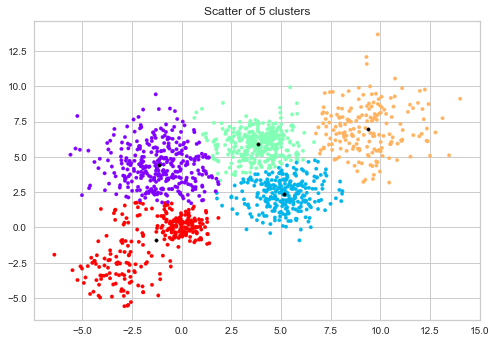

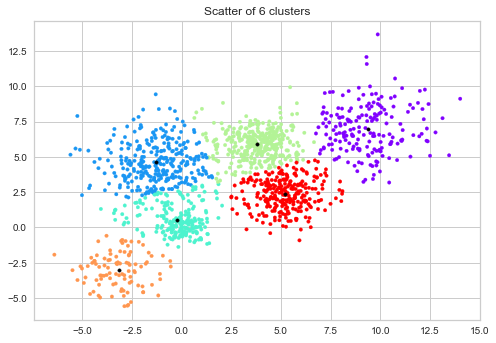

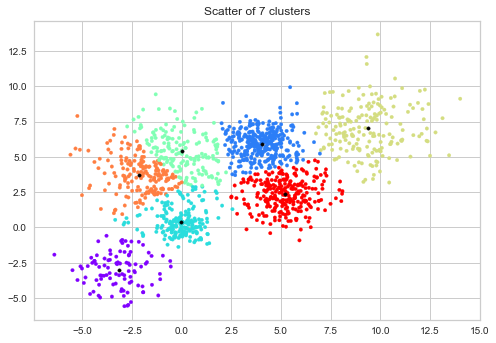

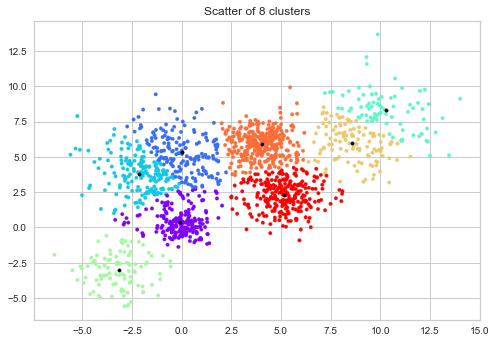

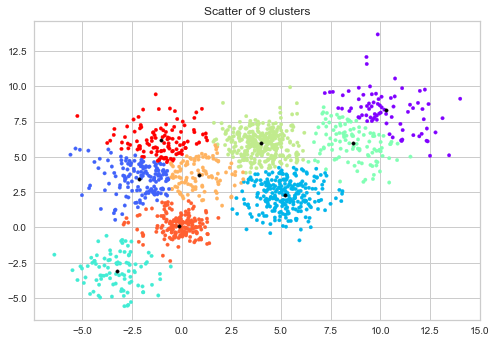

In [112]:
for k_values in range(5,10):
    compare_kmeans(test,k_values)

### Elbow Method

###### Plotting distortion function versus K and determining the approriate value of k


In [41]:
def elbow_K(data):
    # Plotting distortion function versus K and determining the approriate value of k
    distortions = []
    inertias = []
    mapping1 = {}
    mapping2 = {}
    K_rng = range(1,10)
    
    for k in K_rng:
        # Building and fitting the model
        kmeanModel = KMeans(n_clusters=k).fit(data)
        kmeanModel.fit(data)

        distortions.append(sum(np.min(cdist(data, kmeanModel.cluster_centers_,
                                'euclidean'), axis=1)) / data.shape[0])
        inertias.append(kmeanModel.inertia_)

        mapping1[k] = sum(np.min(cdist(data, kmeanModel.cluster_centers_,
                           'euclidean'), axis=1)) / data.shape[0]
        mapping2[k] = kmeanModel.inertia_

    plt.plot(K_rng, distortions, 'bx-')
    plt.xlabel('Values of K')
    plt.ylabel('Distortion')
    plt.title('The Elbow Method using Distortion')
    plt.show()

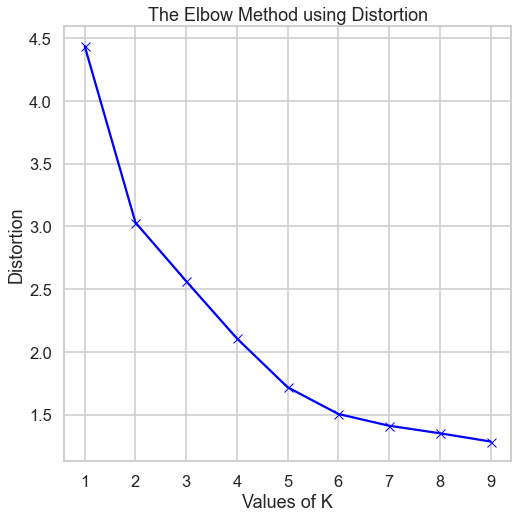

In [40]:
elbow_K(test)

A good K value here would be 5 as it is starts a constant decreasing trend

#### Silhouette Score 

In [38]:
# Issue raised here: https://github.com/DistrictDataLabs/yellowbrick/issues/1137
try:
    # See #1137: this allows compatibility for scikit-learn >= 0.24
    from sklearn.utils import safe_indexing
except ImportError:
    from sklearn.utils import _safe_indexing
from yellowbrick.cluster import SilhouetteVisualizer

In [105]:
def vis_silhouette(data):
    #fig, ax = plt.subplots(2, 2, figsize=(15,8))
    for i in [2,3,4,5,6]:
        '''
        Create KMeans instance for different number of clusters
        '''
        km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
        #q, mod = divmod(i, 2)
        '''
        Create SilhouetteVisualizer instance with KMeans instance
        Fit the visualizer
        '''
        visualizer = SilhouetteVisualizer(km, colors='yellowbrick').fit(test) #, ax=ax[q-1][mod]
        visualizer.show()

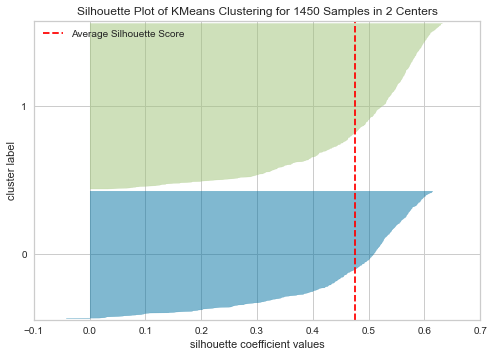

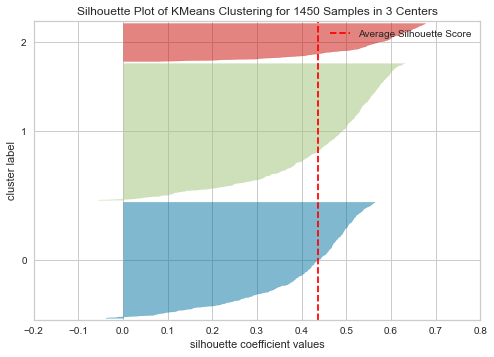

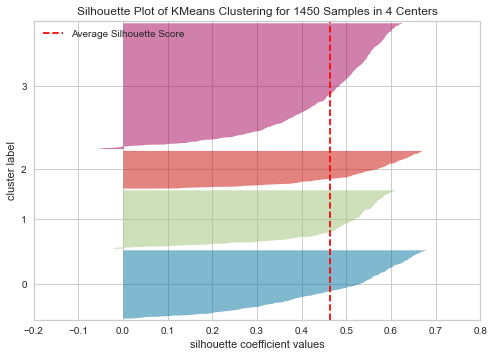

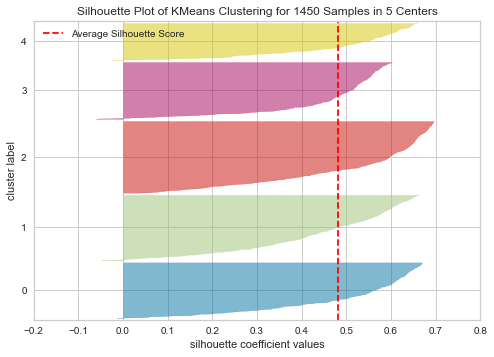

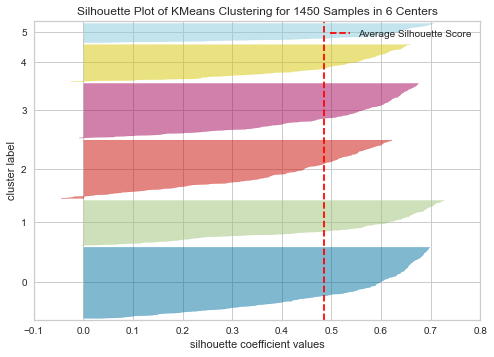

In [106]:
vis_silhouette(test)

#### Which n_cluster did I chose?
* There doesn't appear any presence of clusters with below average silhouette scores, so this will not be a factor
* The values of 4,7,8,9... n_clusters look to be suboptimal for the given data due to the following reasons:
    * Wide fluctuations in the size of the silhouette plots.
* The values of 2, 3(although one clusters is not as uniform as the other), 5, and 6(same flaws as '3') look to be optimal ones. 
    * Also, the fluctuation in size is similar. The thickness of the silhouette plot representing each cluster also is a deciding point. So: 
    * For plot with 2 and 5 clusters, the thickness is more uniform than the plot with 3 clusters.
    * Thus, I can select the optimal number of clusters as either 2 or 5.
    * It would be hard to decide between 2 and 5 since the fluctuations between clusters are almost the same max difference

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

In [14]:
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler, normalize, MinMaxScaler
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as shc
from scipy.cluster import hierarchy

###### Used Agglomerative Clustering to cluster the above data and calculate silhouette_score 

In [186]:
N_clusters = []
silhouette_scores = []
def Custom_Aggl_Clust(data,aff,link,dist):
    ac = AgglomerativeClustering(n_clusters = None, affinity = aff, linkage = link,
                                distance_threshold = dist, compute_full_tree =True).fit(data)
  
    # Visualizing the clustering    
    plt.scatter(data[0], data[1], c = ac.fit_predict(data), cmap ='rainbow',s =13)
    plt.title("Affinity: {} || Linkage: {} || Number of clusters: {}".format(aff,link,ac.n_clusters_))
    plt.show()
    
    N_clusters.append(ac.n_clusters_)
    # Calculating and storing silhouette scores
    try:
        silhouette_scores.append(silhouette_score(data, ac.fit_predict(data)))
    except ValueError:
        pass

# Plotting a bar graph to compare the results
def Silhouette_Score_plt():
    while (N_clusters.count(1)):
        N_clusters.remove(1)
        
    print(N_clusters,silhouette_scores)
    plt.bar(N_clusters, silhouette_scores,color='rgbkymc',edgecolor='y')
    plt.xlabel('${N^{th}}$ Cluster')
    plt.ylabel('Scores')
    plt.show()

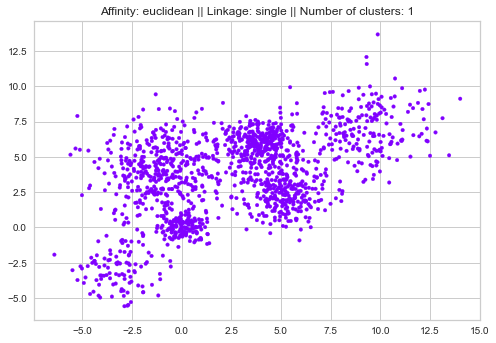

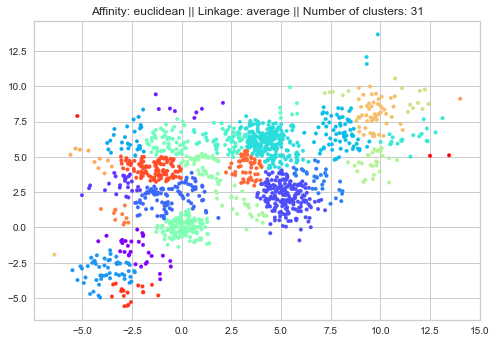

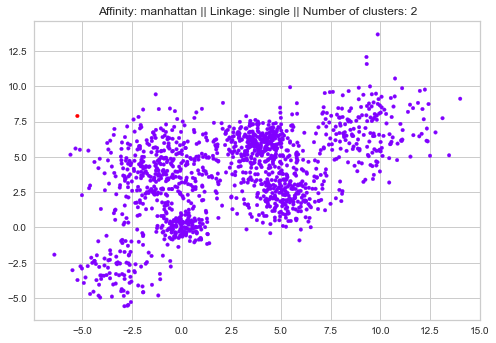

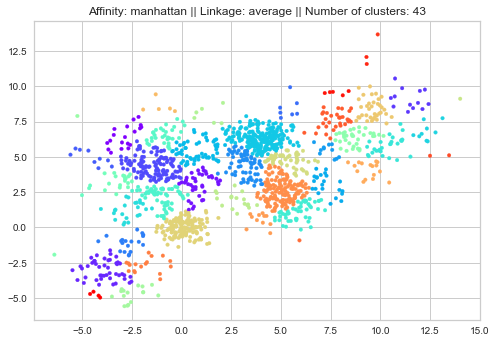

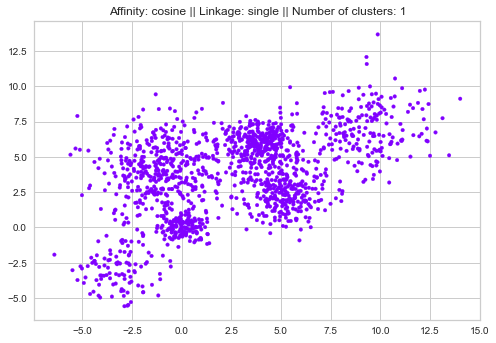

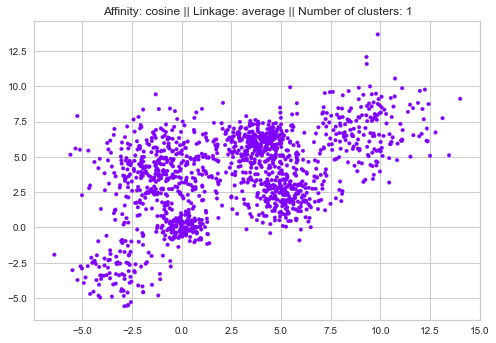

[31, 2, 43] [0.3026059296053282, 0.3218066204847175, 0.31009223800746305]


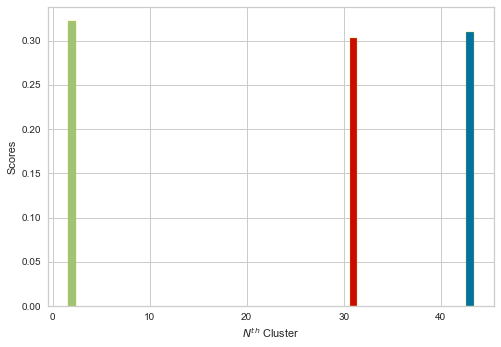

In [187]:
affinities = ['euclidean',  'manhattan', 'cosine']
linkages = ['single','average']

# only var to be edited (How to choose distance thresh??)
## N.B Choosing a low distance thrsh value would result in too many clusters i.e. 300+
dist_thrsh = 2.2


for affin in affinities:
    for links in linkages:
        Custom_Aggl_Clust(df_s,affin,links,dist_thrsh)

Silhouette_Score_plt()

N_clusters.clear()
silhouette_scores.clear()

#### For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters

In [26]:
def Dendograph_silh(data):
    Z = hierarchy.linkage(data, method = 'average')
    print(Z.min())
    
    plt.figure(figsize = (16, 16))
    plt.title('Visualising the data')
    Dendrogram = shc.dendrogram((shc.linkage(data, method ='ward')))
    plt.axhline(y = Z.max(),color='b',linestyle='-')

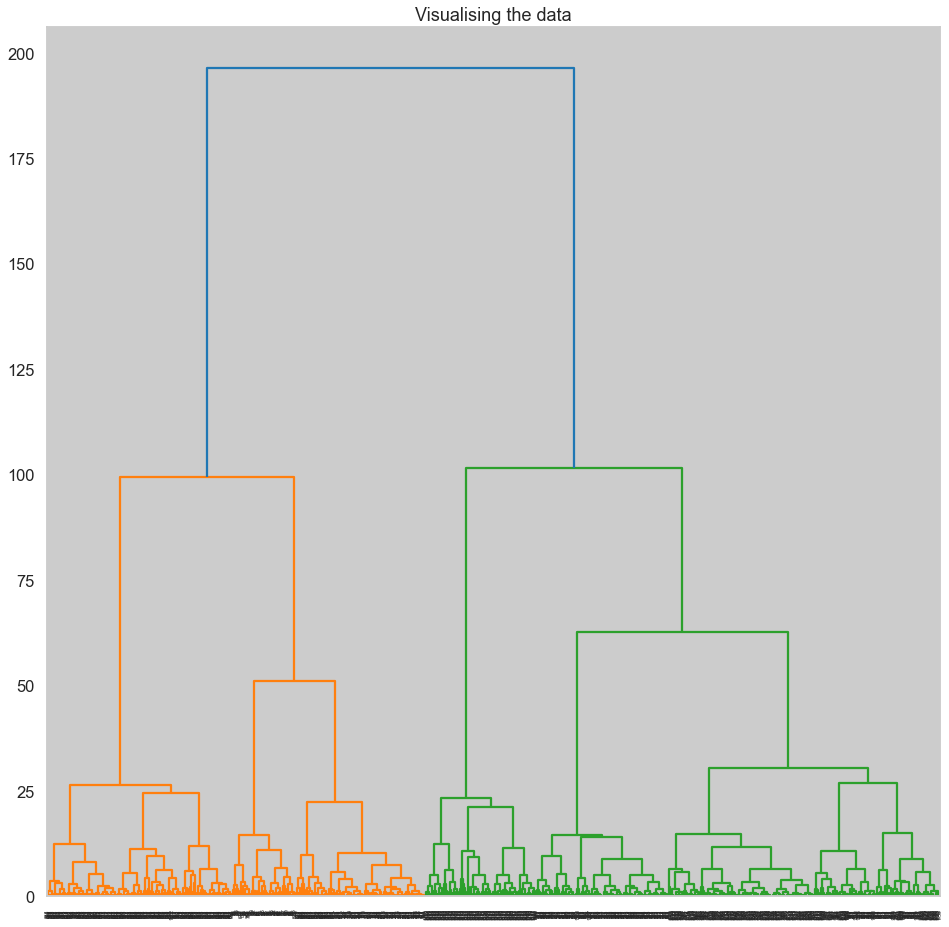

In [71]:
Dendograph_silh(df_s)

### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

In [8]:
from kneed import KneeLocator

In [15]:
def DB_Scan(data,min_s):
    # Elbow method but with kneed
    nearest_neighbors = NearestNeighbors(n_neighbors=11)
    neighbors = nearest_neighbors.fit(data)

    distances, indices = neighbors.kneighbors(data)
    distances = np.sort(distances[:,10], axis=0)

    i = np.arange(len(distances))
    knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')
    opt_elbw = distances[knee.knee]
    print(opt_elbw)

    fig = plt.figure(figsize=(5, 5))
    knee.plot_knee()
    plt.xlabel("Points")
    plt.ylabel("Distance")
    plt.show()
    print('Elbow Point is {}: '.format(distances[knee.knee]))
    
    dbscan = DBSCAN(eps=opt_elbw, min_samples=min_s) # need to apply elbow method with kneed  instead of experimenting
    dbscan.fit(data)

    # Visualizing DBSCAN
    plt.scatter(data[:, 0], data[:, 1], c=dbscan.labels_, label=y)
    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$")

    # Number of Clusters
    labels=dbscan.labels_
    N_clusts=len(set(labels))-(1 if -1 in labels else 0)
    print('Estimated number of clusters {}: '.format(N_clusts) )

    # Identify number of Noise points and clustered points
    n_noise = list(dbscan.labels_).count(-1)
    n_clustered = data.size - n_noise
    print('Estimated number of noise points: {}'.format(n_noise))
    print('Estimated number of clustered points: {}'.format(n_clustered))
    print("Total number of points: {} ".format(data.size))
    print("Effeciency: {:%}".format(n_clustered/(data.size)))
    # Calculating v_measure
    #print('v_measure =', v_measure_score(y, labels))


<Figure size 360x360 with 0 Axes>

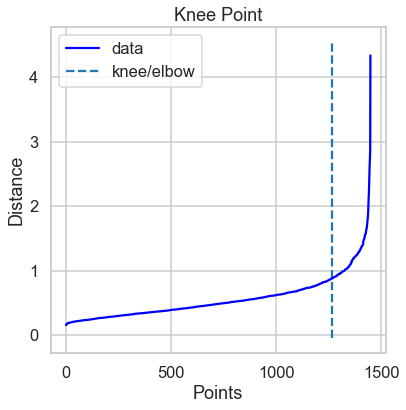

Elbow Point is 0.8795662680174702: 
Estimated number of clusters 4: 
Estimated number of noise points: 260
Estimated number of clustered points: 2640
Total number of points: 2900 
Effeciency: 91.034483%


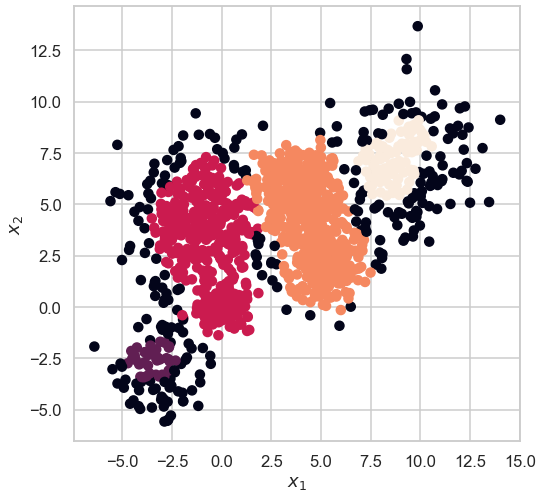

In [237]:
DB_Scan(test,25)

### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

In [16]:
from sklearn.mixture import GaussianMixture
import seaborn as sns
import plotly.express as px

In [148]:
### To get probability I can use verbose=2, but this will only output log probability (as per documentation)
### So we will have to convert to probability by using this equation e^(log_prob)/(1+e^{log_prob)
### Alternatively, I use the predict_proba method to compute the components' density for each sample.
### For the 2D contours the contour output might not be shown properly because it needs to be run. 

def Gaussian_cov(data,cov):
    gmm = GaussianMixture(n_components = 4, covariance_type=cov)
    gmm.fit(data)
    
    # Calculating the probability density and storing in df
    #global probs  
    probs = gmm.predict_proba(data)
    #global probs_df 
    probs_df = pd.DataFrame(probs)
        
    # Assign a label to each sample
    labels = gmm.predict(data)
    data['labels'] = labels
    data0 = data[data['labels']== 0]
    data1 = data[data['labels']== 1]
    data2 = data[data['labels']== 2]
    data3 = data[data['labels']== 3]
        
    fig = plt.figure(figsize=(25,25))
    fig.suptitle('Plots for the 4 Mixture Components with {} covariance'.format(cov),fontsize=30)
    fig.subplots_adjust(top=0.95)
    
    # Plotting three clusters in same plot
    plt.subplot(2, 2, 1)
    plt.scatter(data0[0], data0[1], c ='b',s=25)
    plt.scatter(data1[0], data1[1], c ='orange',s=25)
    plt.scatter(data2[0], data2[1], c ='g',s=25)
    plt.scatter(data3[0], data3[1], c ='r',s=25)
    plt.title('Scatter plot of the Mixture Components')
    
    # Visualizing Resultant Distributions
    plt.subplot(2, 2, 2)
    sns.kdeplot(data=probs_df).set(title=' Desnsity plot of the mixture components')
    plt.show()
    
    # 2D Contour plot of resultant Resultant Distributions
    fig = px.density_contour(probs_df)
    fig.update_traces(contours_coloring="fill",contours_showlabels = True) 
    fig.update_layout(title_text='2D Contour Plot of Resultant Distributions', title_x=0.5)
    fig.show()

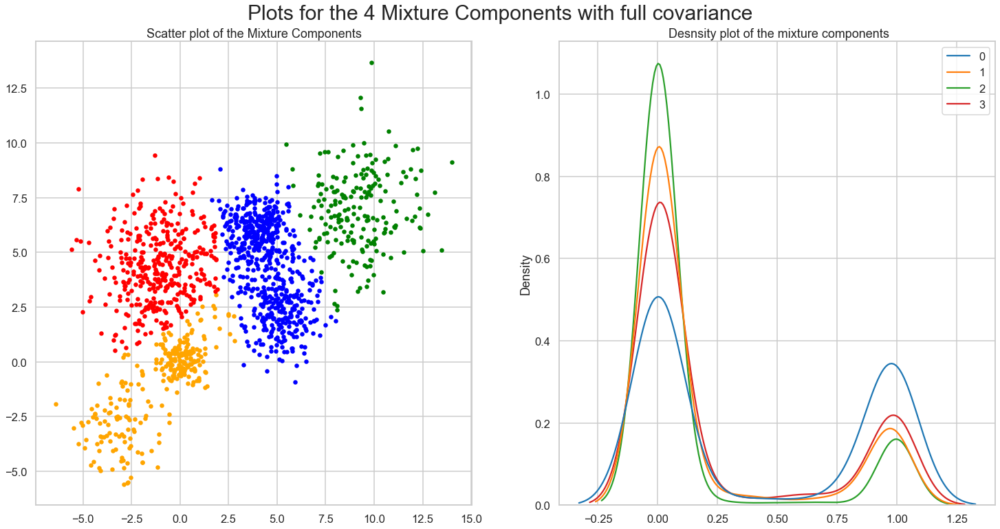

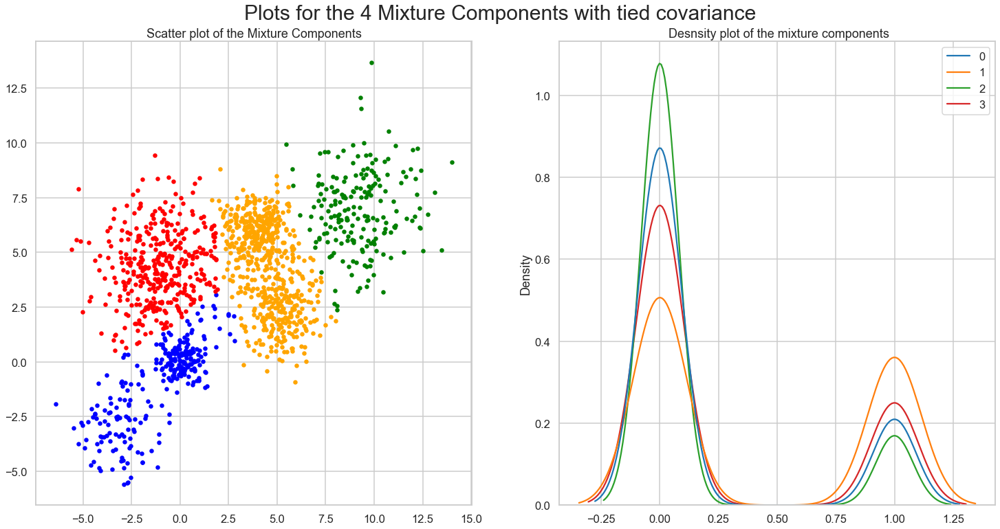

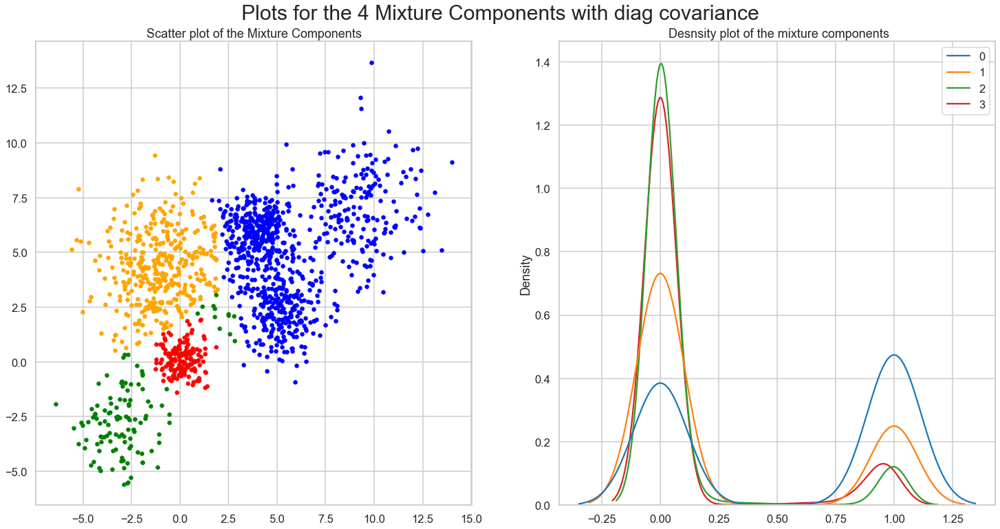

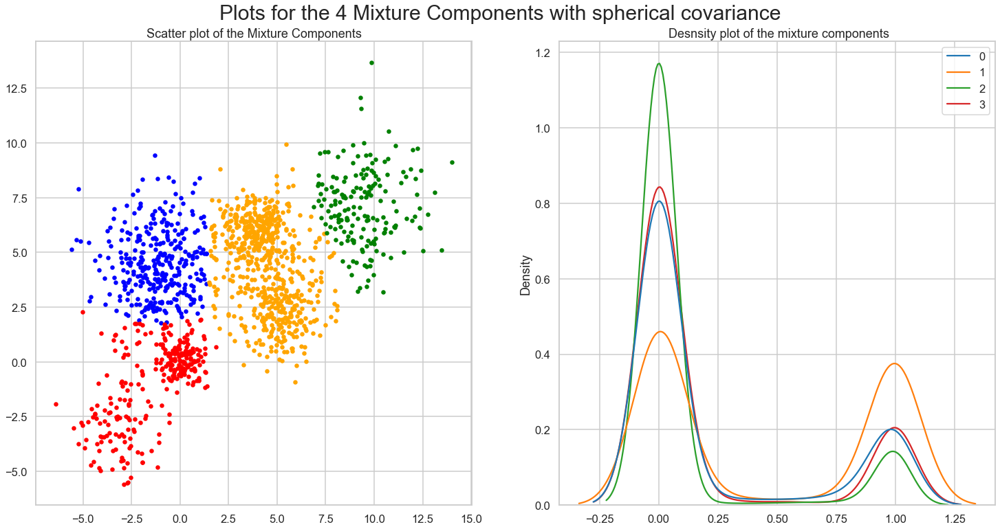

In [35]:
cov_types = ['full','tied','diag','spherical']
for covars in cov_types:
    Gaussian_cov(df_s,covars)

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [18]:
from sklearn.datasets import load_iris

### For indexing purposes, sepal and petal length columns will be renamed to 0 while width will be 1

In [19]:
iris_data = load_iris()
df_iris = pd.DataFrame(data= np.c_[iris_data['data'], iris_data['target']],
                     columns= iris_data['feature_names'] + ['target'])

In [20]:
# First we need to divide the dataset into two column-dataframe:
# First dataframe is sepal length and width || Second df is petal len and width
df_sp = df_iris.filter(['sepal length (cm)','sepal width (cm)'], axis=1)
df_sp = df_sp.rename(columns={"sepal length (cm)":0,'sepal width (cm)':1})

df_pt = df_iris.filter(['petal length (cm)','petal width (cm)'], axis=1)
df_pt = df_pt.rename(columns={"petal length (cm)":0,'petal width (cm)':1})


arr_sp = np.array(df_sp)
arr_pt = np.array(df_pt)

### Kmeans and Elbow method

### For sepal

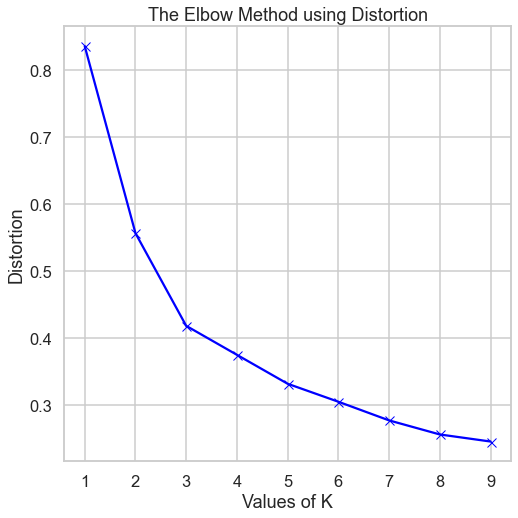

In [110]:
elbow_K(arr_sp)

* Here the K value doesn't start a continuous decreasing trend. However, we can choose a rough starting value fo 7

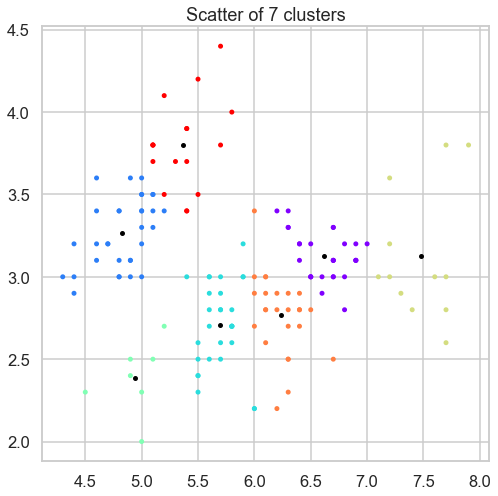

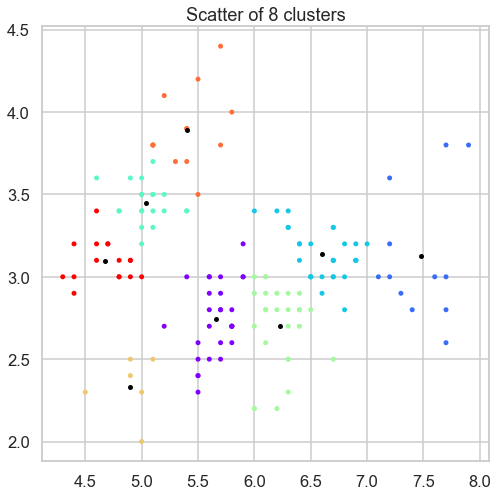

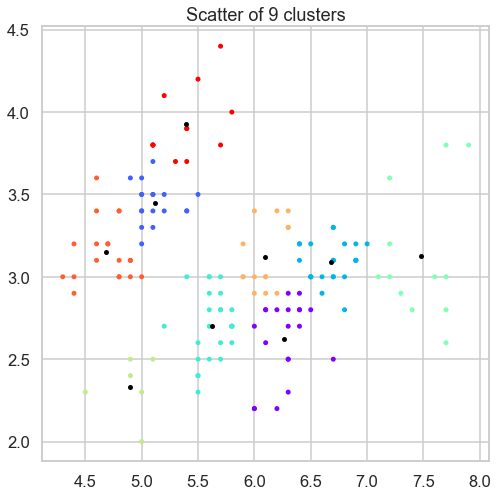

In [112]:
for k_sp in range(7,10):
    compare_kmeans(arr_sp,k_sp)

### For petal

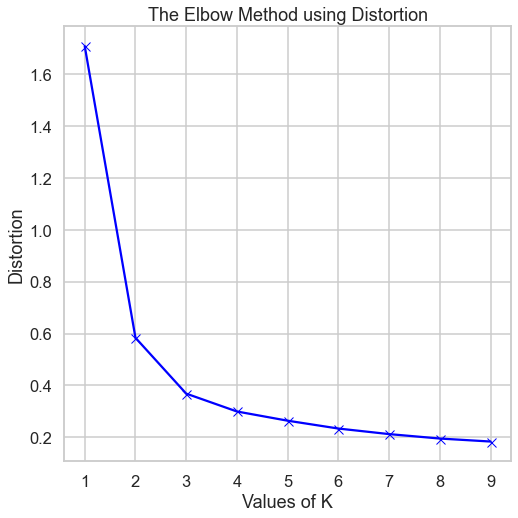

In [113]:
elbow_K(arr_pt)

* Here the K value starts a continuous decreasing trend. We can choose rough values from 3-9

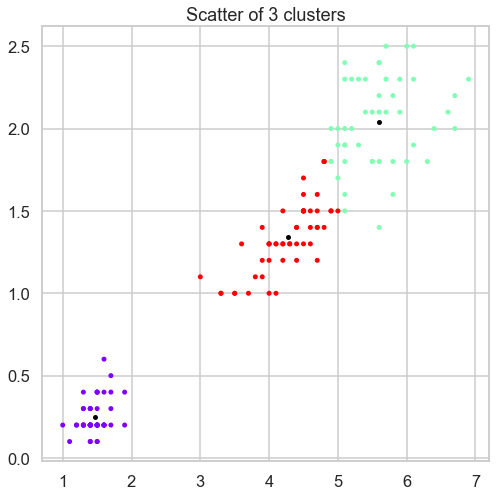

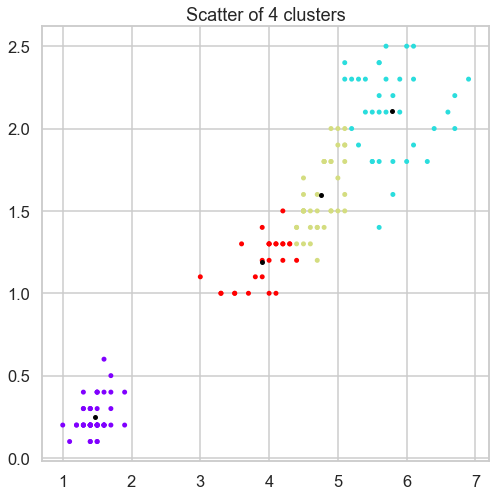

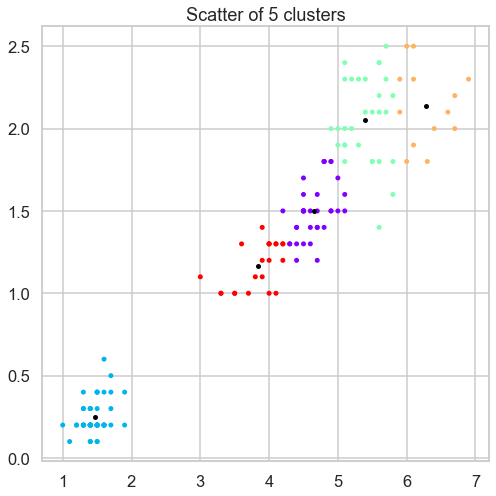

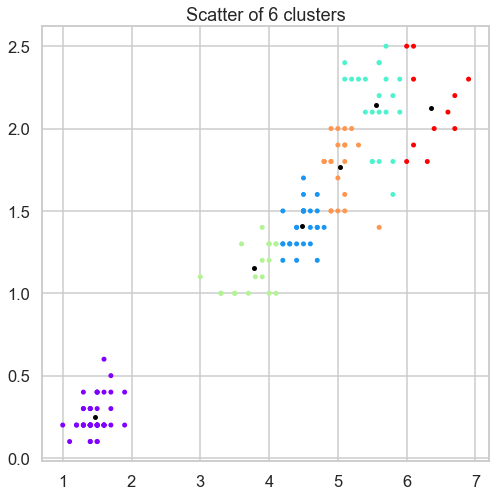

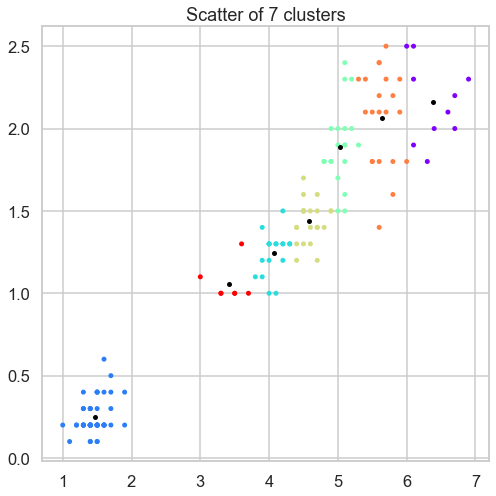

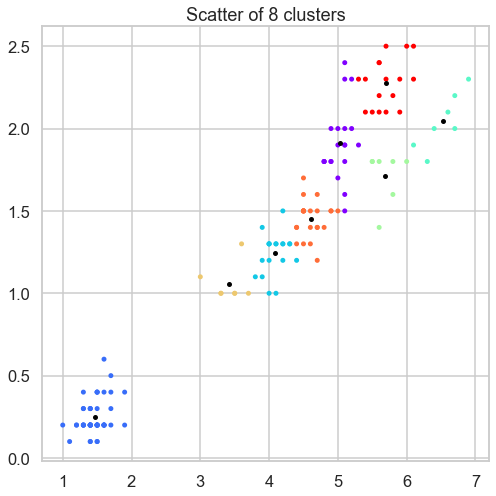

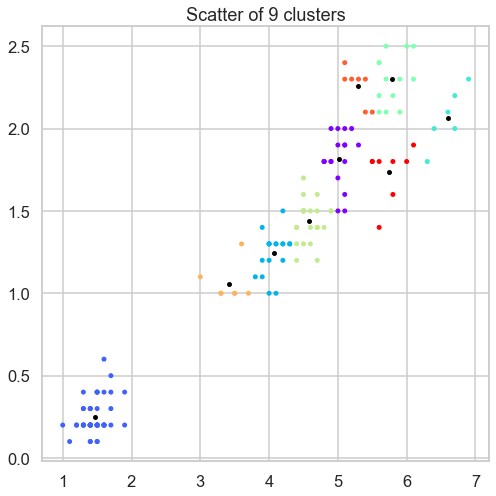

In [115]:
for k_sp in range(3,10):
    compare_kmeans(arr_pt,k_sp)

### Hierarchal Clustering

* For Sepal

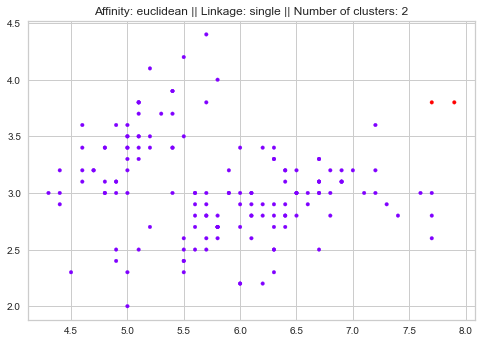

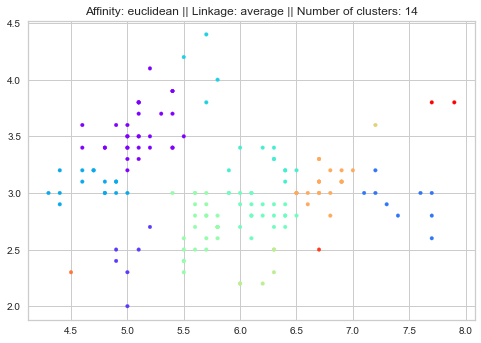

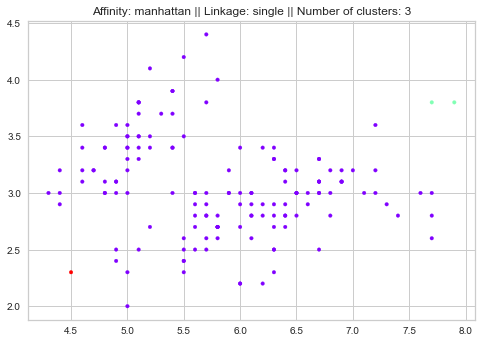

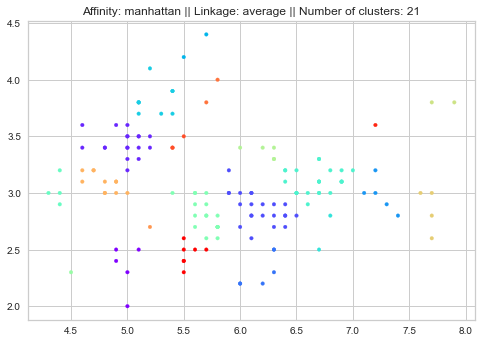

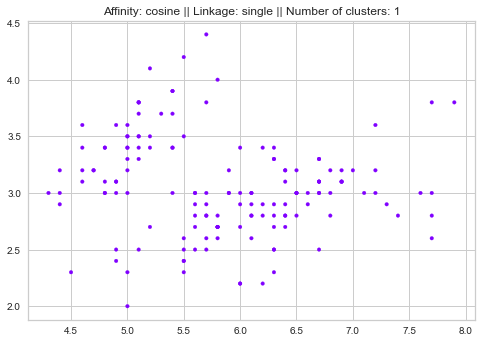

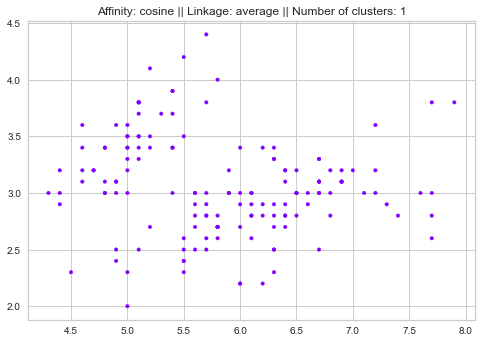

[2, 14, 3, 21] [0.43184272400211776, 0.3925741707352614, 0.13206524649110635, 0.37075454716855494]


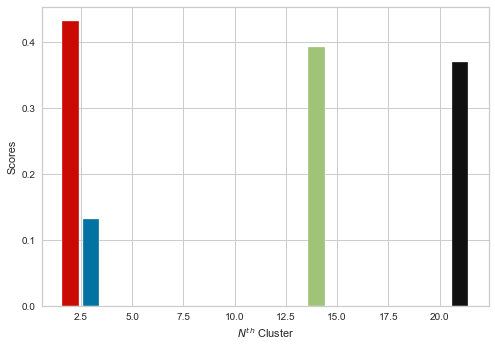

In [179]:
N_clusters = []
silhouette_scores = []

affinities = ['euclidean',  'manhattan', 'cosine']
linkages = ['single','average']
dist_thrsh = .5 # only var to be edited (How to choose distance thresh??)

for affin in affinities:
    for links in linkages:
        Custom_Aggl_Clust(df_sp,affin,links,dist_thrsh)

Silhouette_Score_plt()

N_clusters.clear()
silhouette_scores.clear()

* For Petal

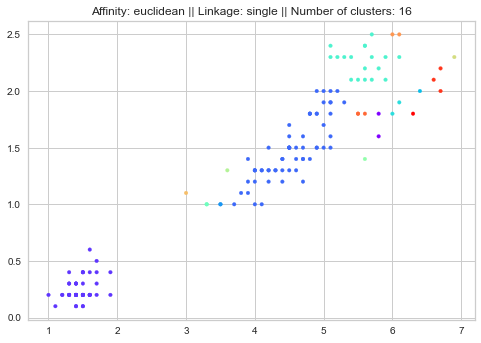

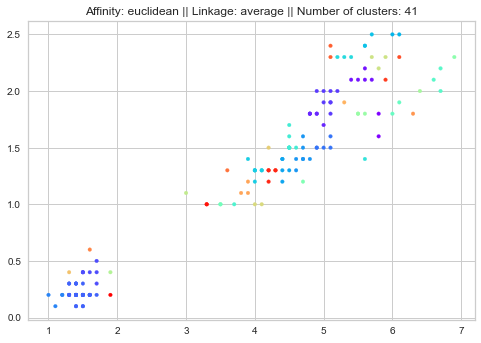

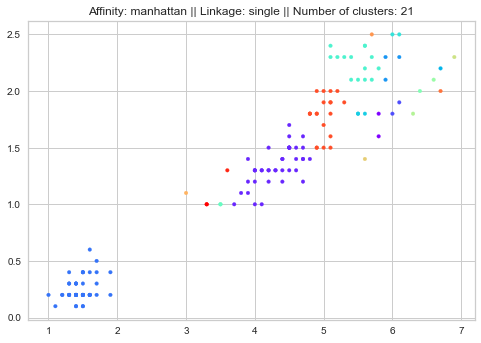

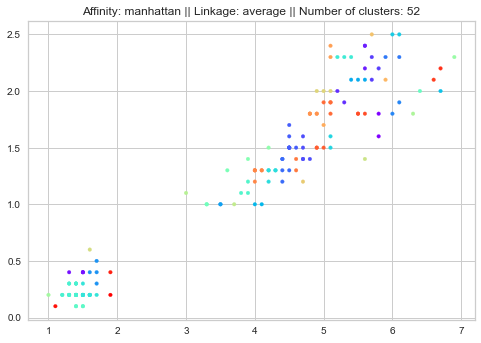

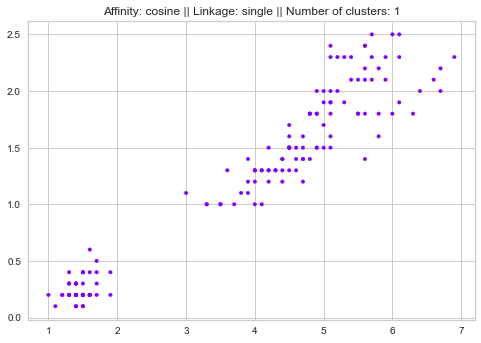

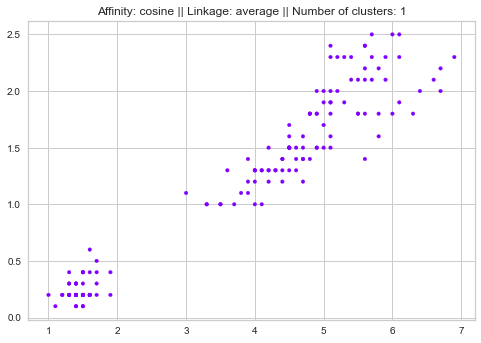

[16, 41, 21, 52] [0.3826125417396182, 0.3494263578519768, 0.45666246062960636, 0.3489154637798357]


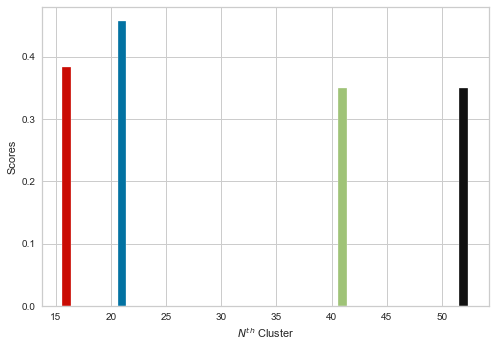

In [184]:
N_clusters = []
silhouette_scores = []

affinities = ['euclidean',  'manhattan', 'cosine']
linkages = ['single','average']
dist_thrsh = .2 # only var to be edited (How to choose distance thresh??)

for affin in affinities:
    for links in linkages:
        Custom_Aggl_Clust(df_pt,affin,links,dist_thrsh)

Silhouette_Score_plt()

N_clusters.clear()
silhouette_scores.clear()

### Dendograph , silhouette scores and display the resulting clusters

For Sepal

297.0


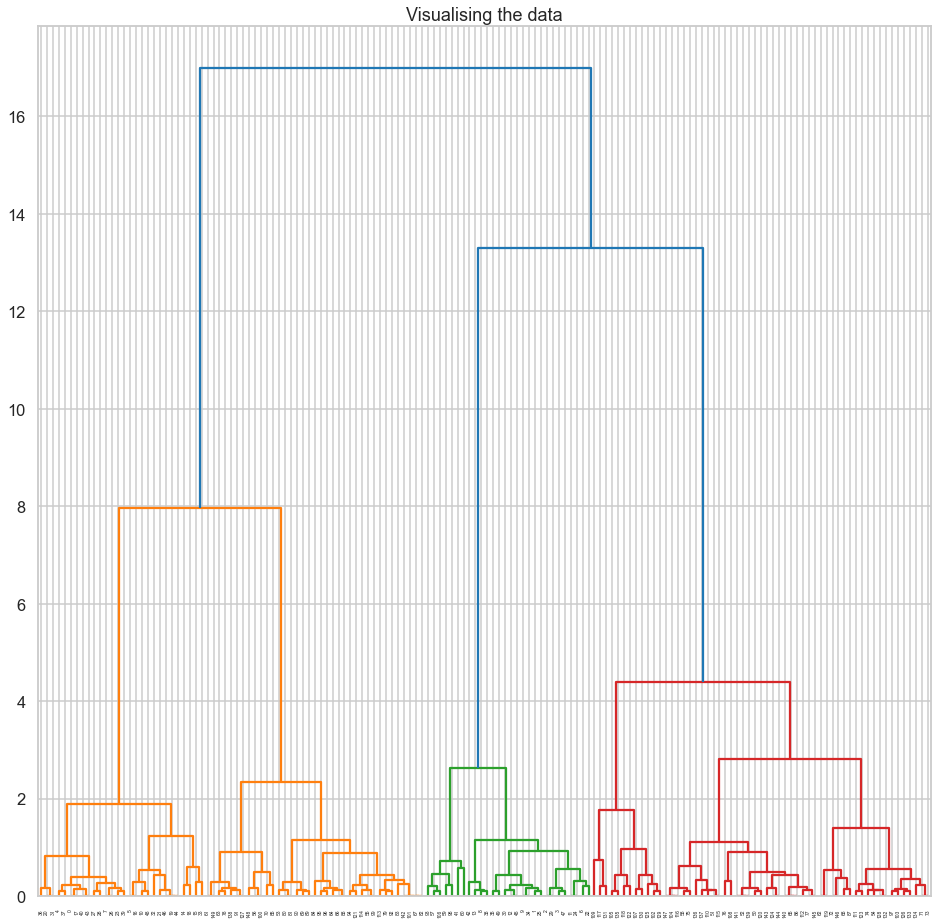

In [258]:
Dendograph_silh(df_sp)

For Petal

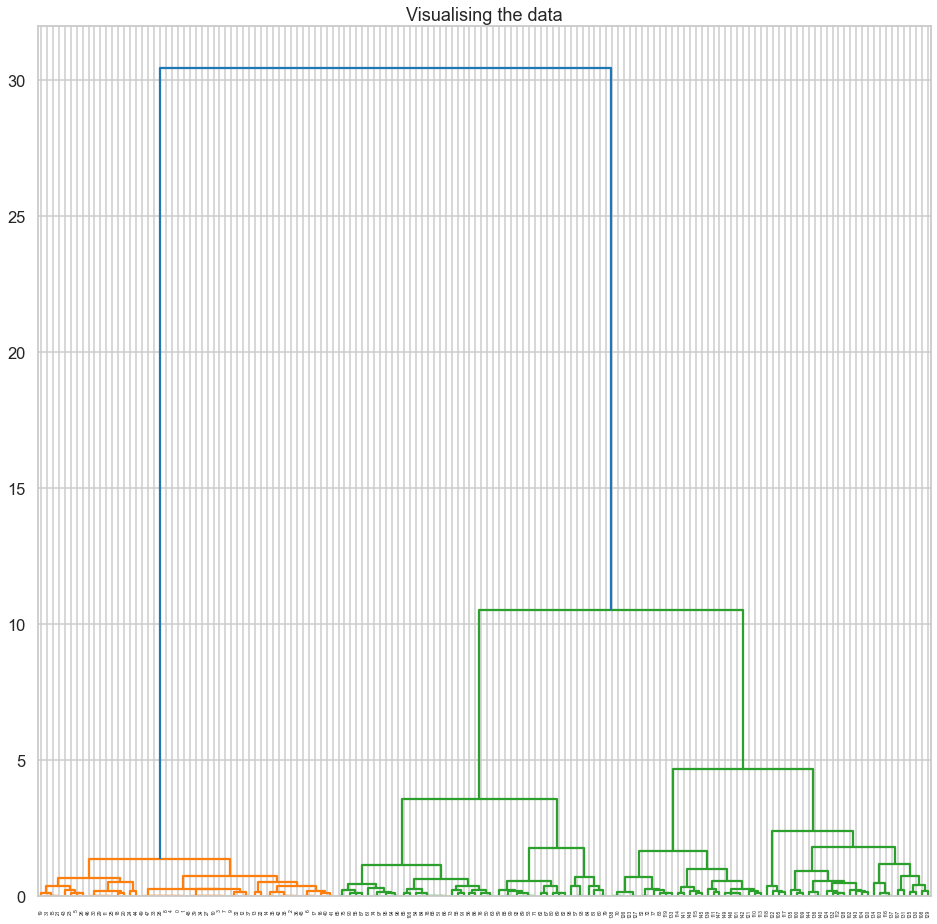

In [213]:
Dendograph_silh(df_pt)

### DBScan 

For Sepal

0.49999999999999983


<Figure size 360x360 with 0 Axes>

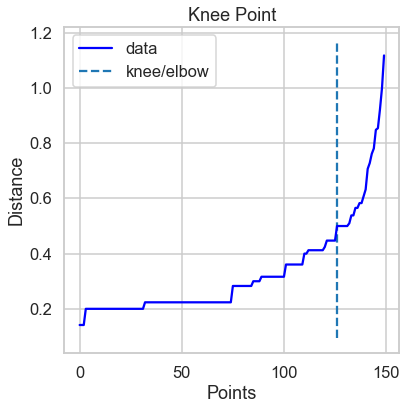

Elbow Point is 0.49999999999999983: 
Estimated number of clusters 2: 
Estimated number of noise points: 15
Estimated number of clustered points: 285
Total number of points: 300 
Effeciency: 95.000000%


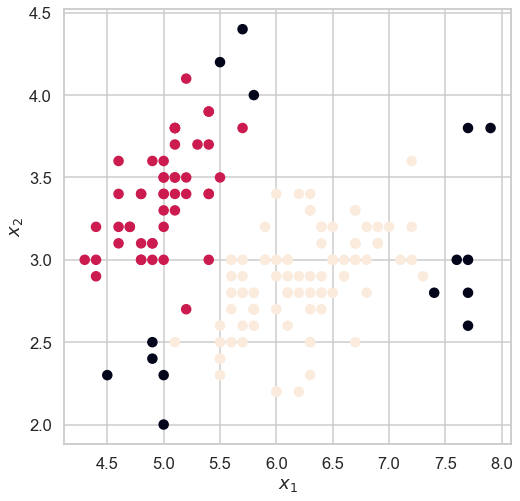

In [242]:
DB_Scan(arr_sp,25)

For Petal

<Figure size 360x360 with 0 Axes>

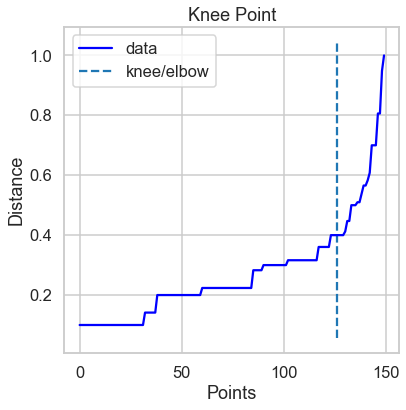

Elbow Point is 0.3999999999999999: 
Estimated number of clusters 2: 
Estimated number of noise points: 51
Estimated number of clustered points: 249
Total number of points: 300 
Effeciency: 83.000000%


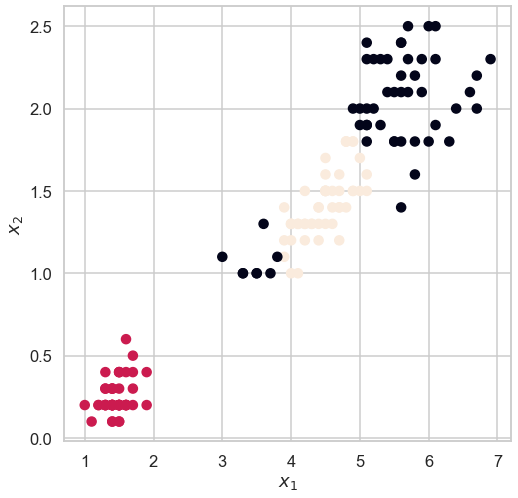

In [239]:
DB_Scan(arr_pt,25)

### Gaussian Mixture

For Sepal

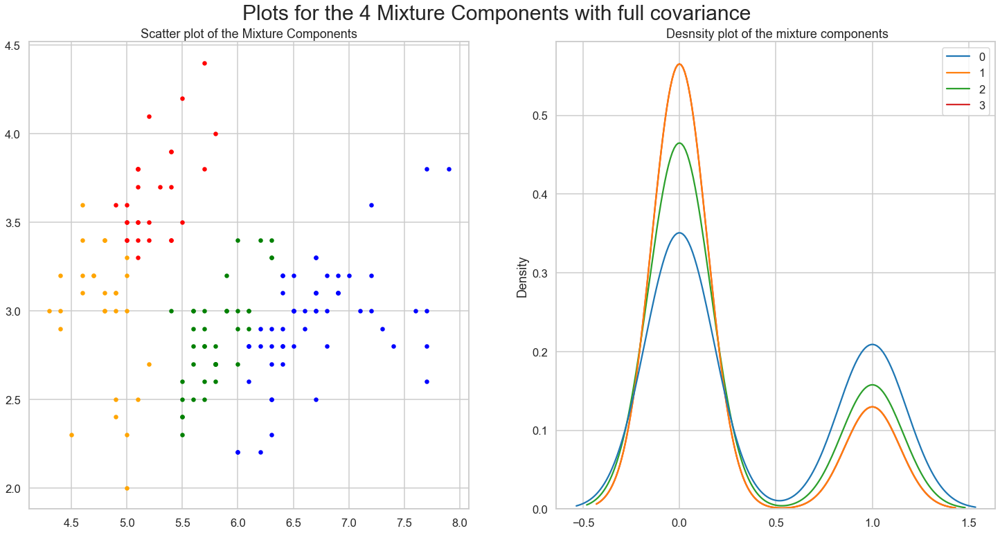

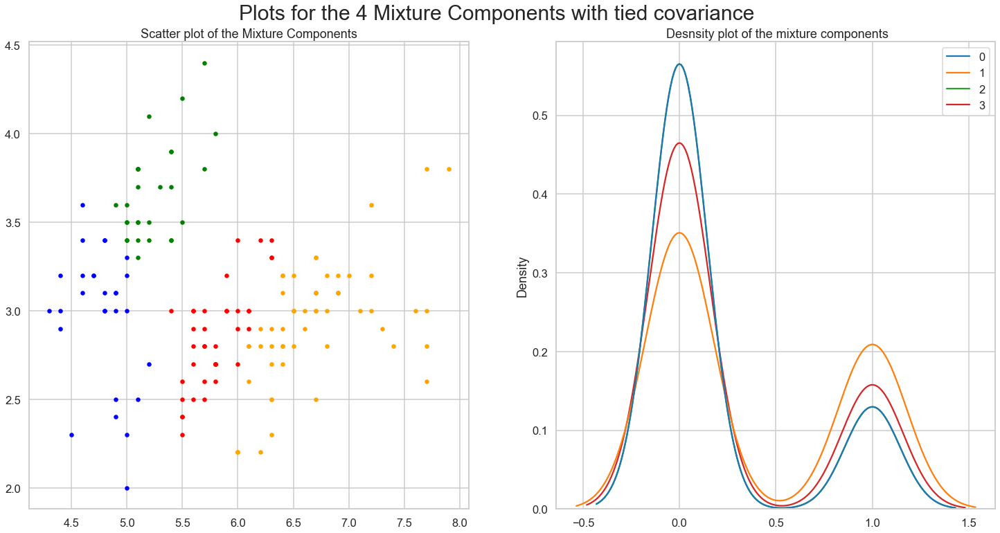

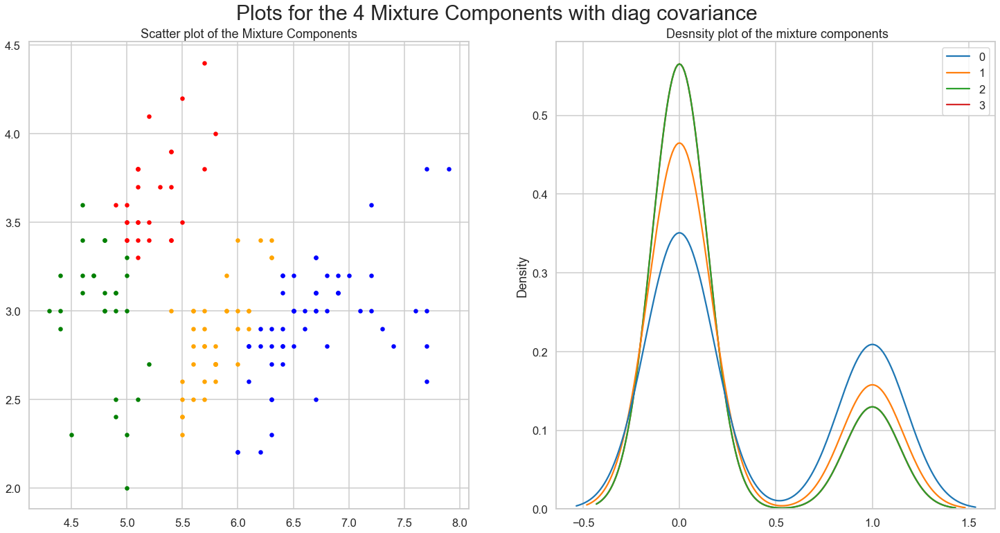

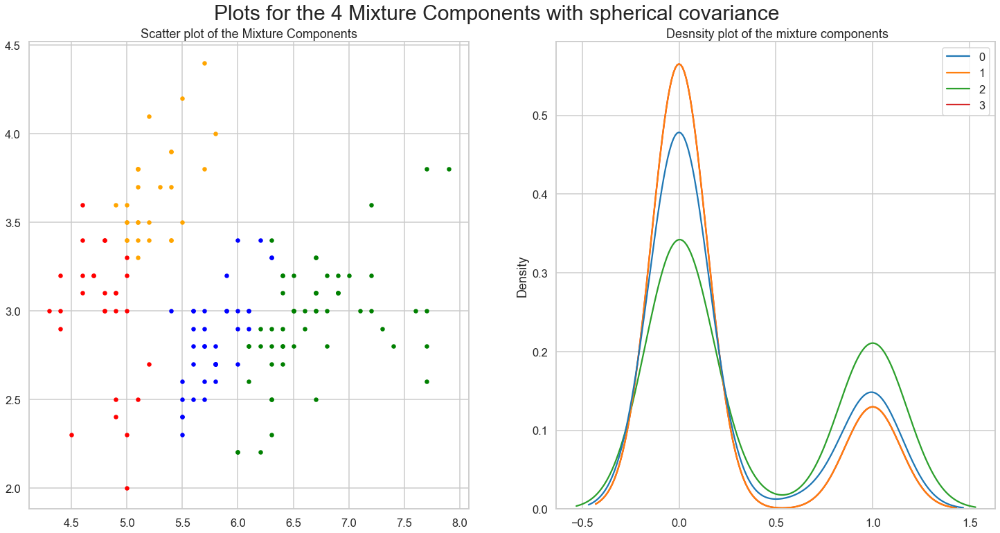

In [241]:
for covars in cov_types:
    Gaussian_cov(df_sp,covars)

For Petal

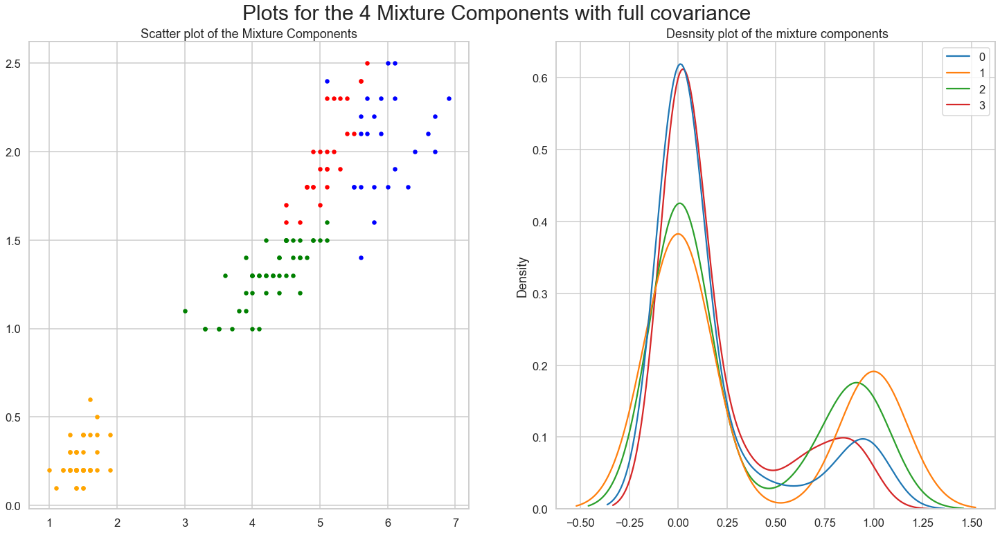

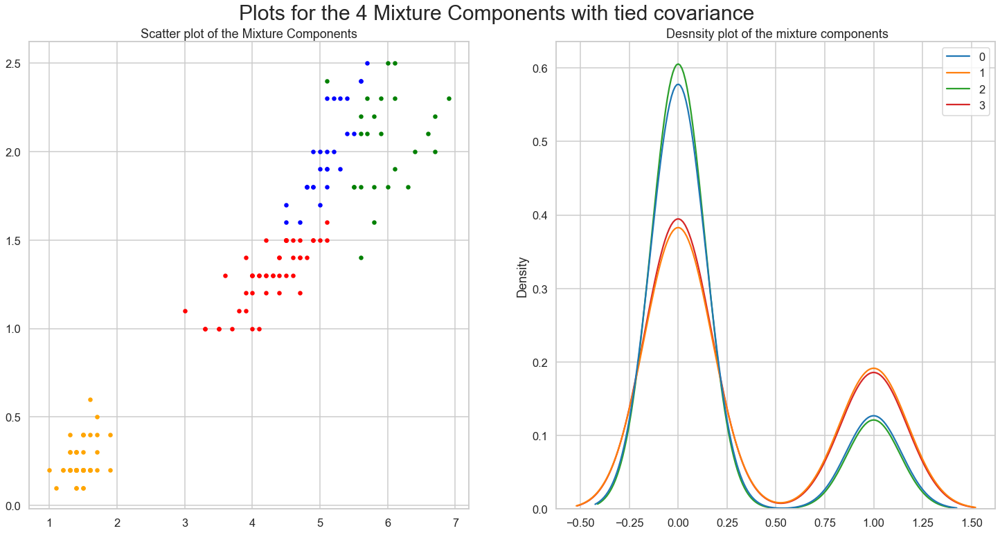

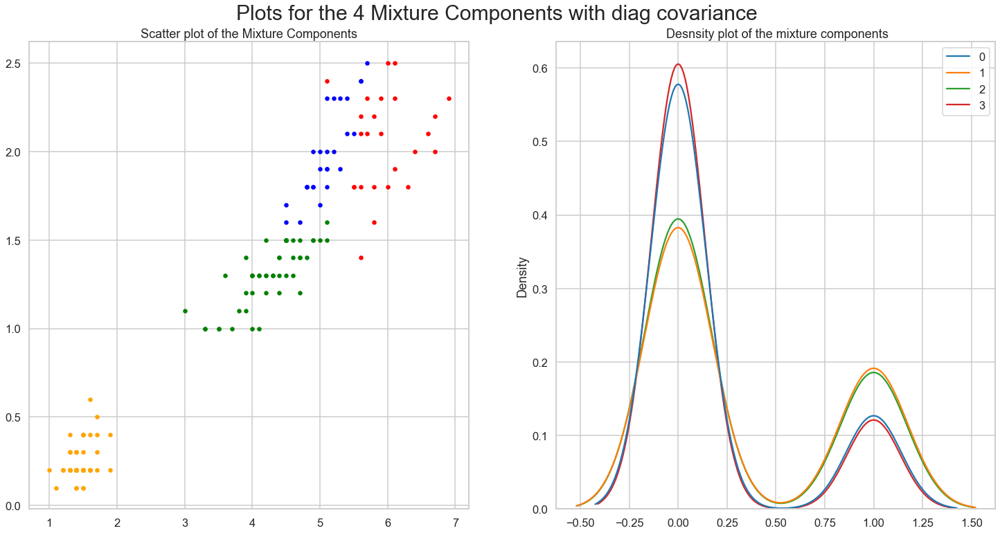

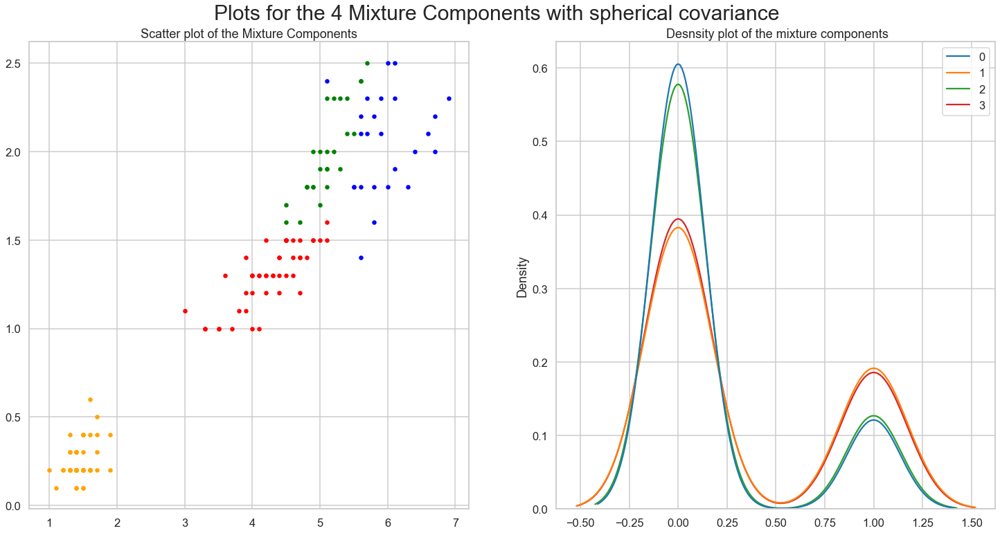

In [232]:
for covars in cov_types:
    Gaussian_cov(df_pt,covars)

* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

## Normalizing the iris data set

In [21]:
# Scaling the data so that all the features become comparable using MinMax
scaler = MinMaxScaler()

## For Petal
df_sp_scaled = scaler.fit_transform(df_sp)
  
# Normalizing the data so that the data approximately 
# follows a Gaussian distribution
df_sp_normed = normalize(df_sp_scaled)
  
# Converting the numpy array into a pandas DataFrame
df_sp_normed = pd.DataFrame(df_sp_normed)

                    ##### For Petal  #####
df_pt_scaled = scaler.fit_transform(df_pt)
  
# Normalizing the data so that the data approximately 
# follows a Gaussian distribution
df_pt_normed = normalize(df_pt_scaled)
  
# Converting the numpy array into a pandas DataFrame
df_pt_normed = pd.DataFrame(df_pt_normed)

# After normalizing the range should be [0,~1]
# Converting to np.arrays
arr_sp_normed = np.array(df_sp_normed)
arr_pt_normed = np.array(df_pt_normed)

In [272]:
#df_sp_normalized.drop(2,axis=1)

### Kmeans and Elbow method

### For sepal

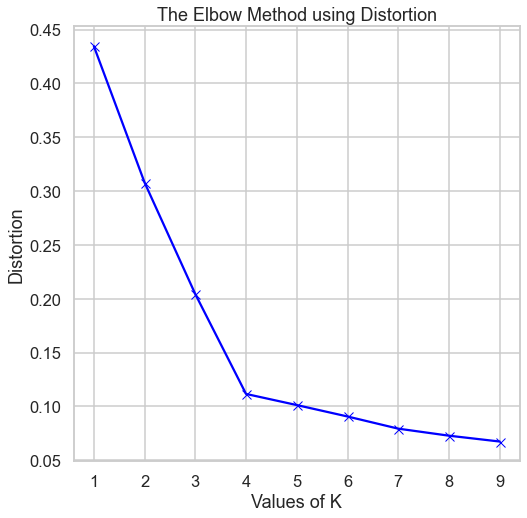

In [276]:
elbow_K(arr_sp_normed)

* Here the K value doesn't start a continuous decreasing trend. However, we can choose rough values from 7-9

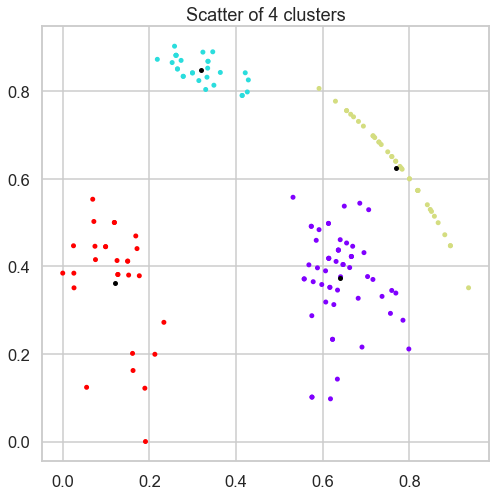

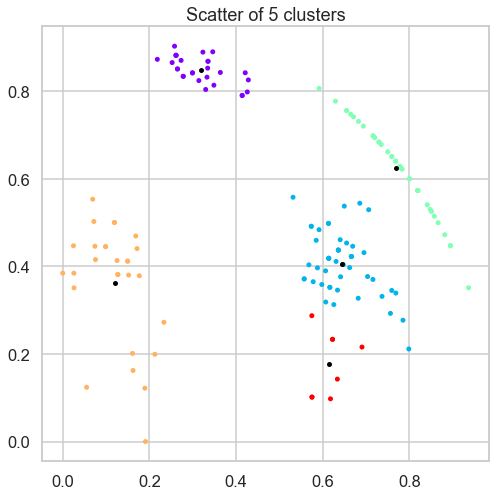

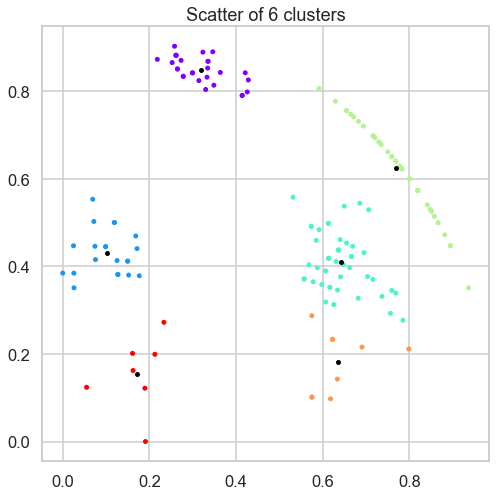

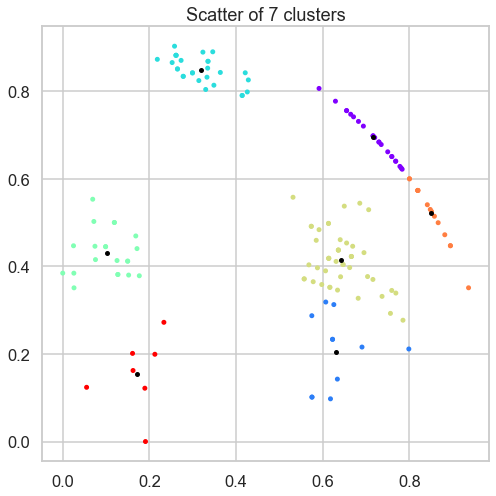

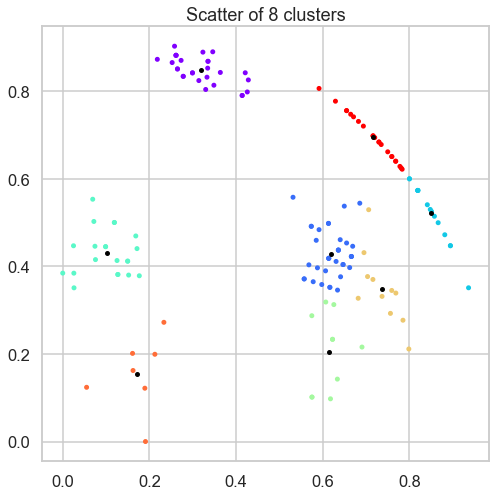

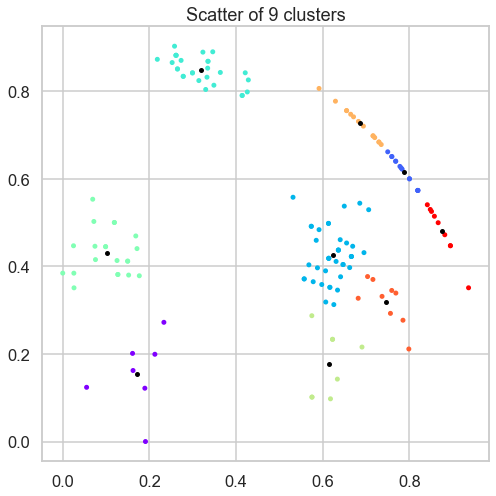

In [277]:
for k_sp in range(4,10):
    compare_kmeans(arr_sp_normed,k_sp)

### For petal

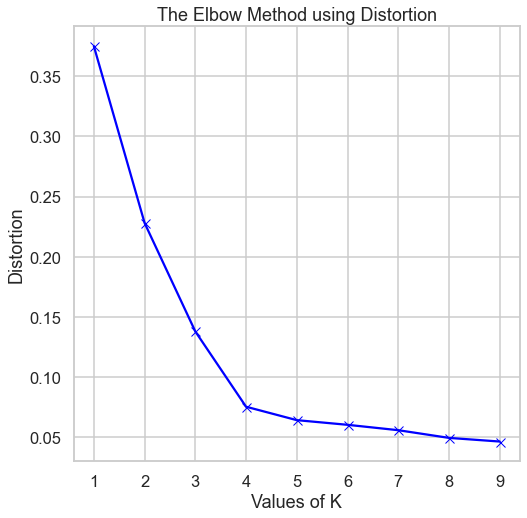

In [278]:
elbow_K(arr_pt_normed)

* Here the K value doesn't start a continuous decreasing trend. However, we can choose rough values from 4-9

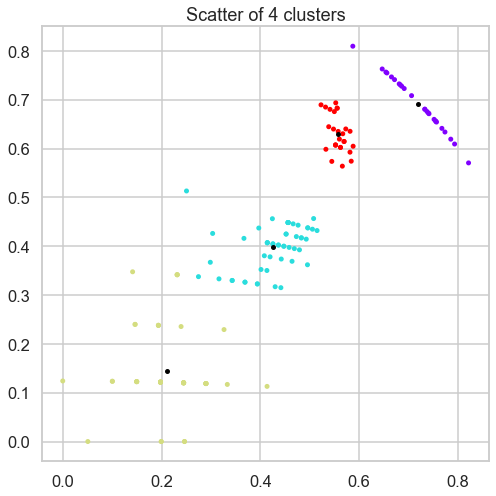

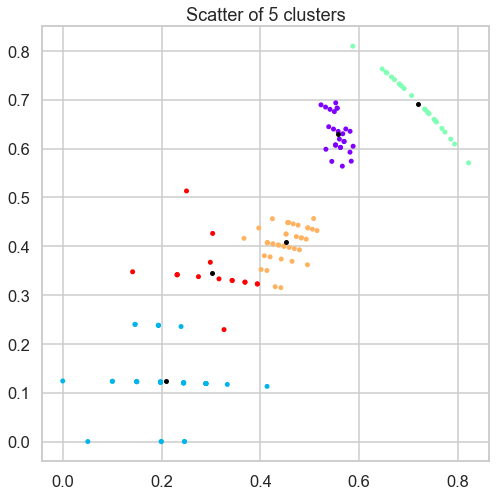

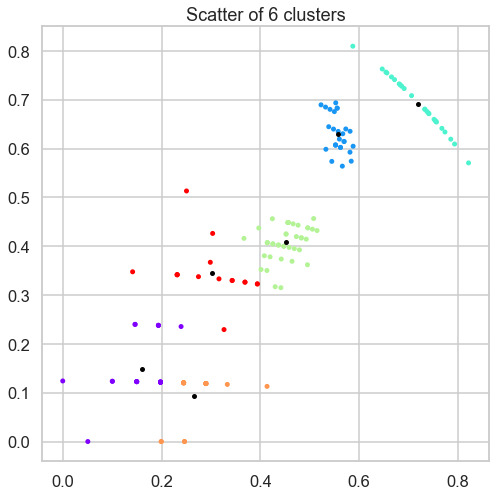

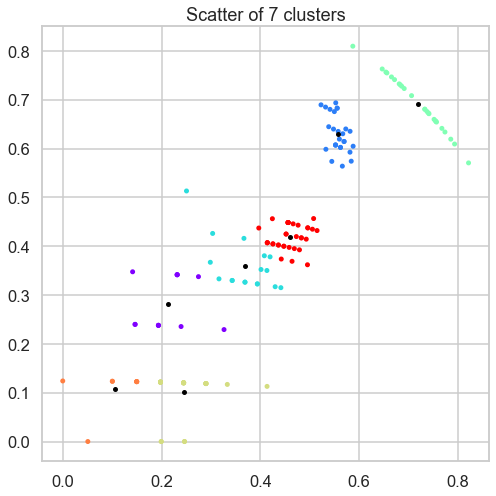

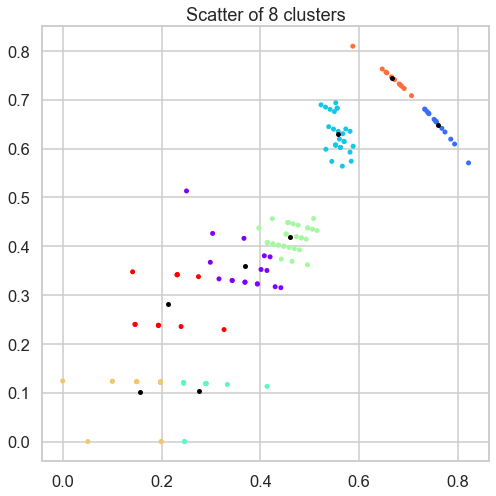

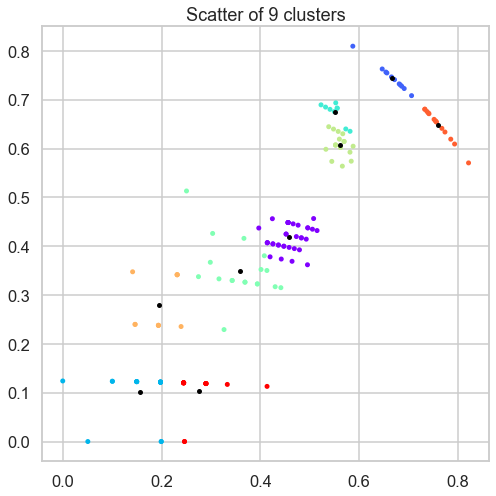

In [279]:
for k_sp in range(4,10):
    compare_kmeans(arr_pt_normed,k_sp)

### Hierarchal Clustering

* For Sepal

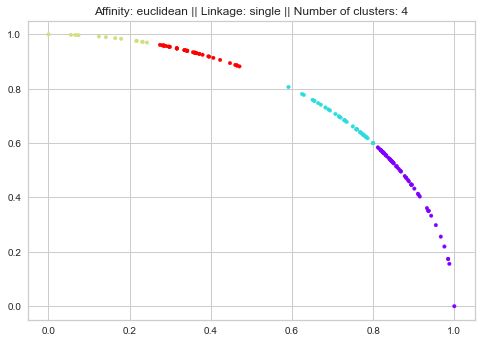

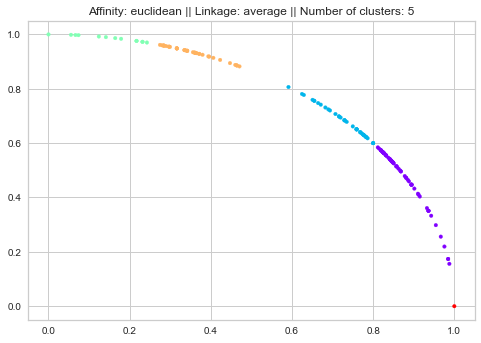

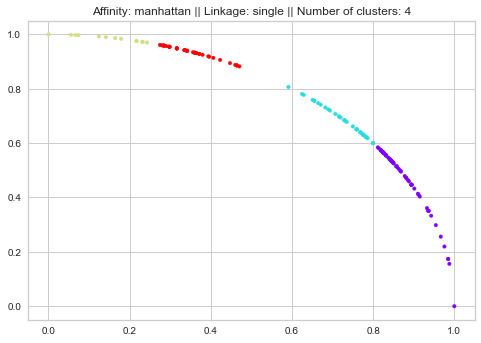

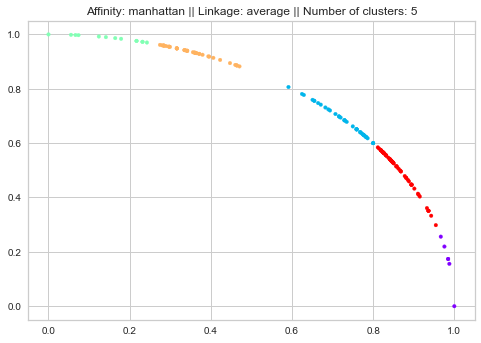

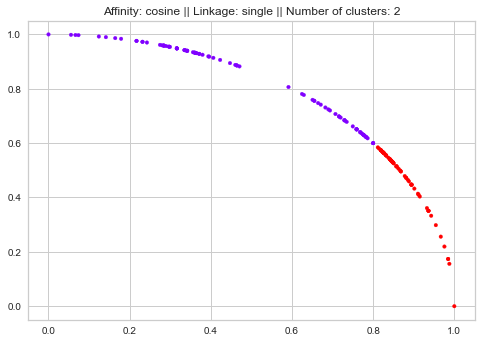

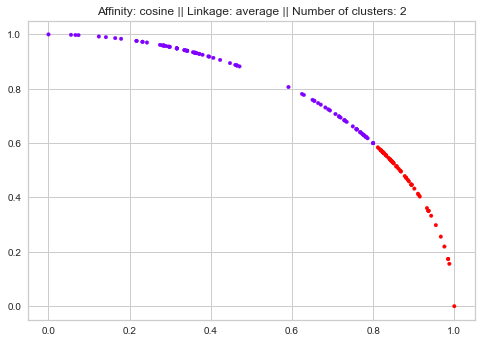

[4, 5, 4, 5, 2, 2] [0.9149784499838454, 0.8203608458574464, 0.9149784499838454, 0.8328509131543401, 0.7354867318465665, 0.7354867318465665]


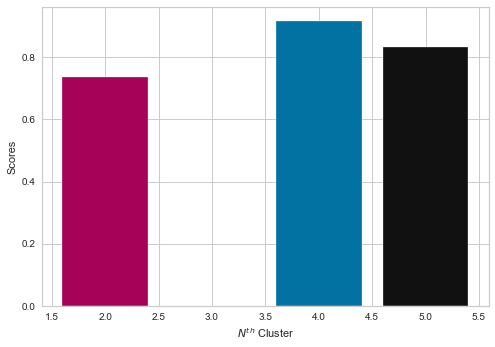

In [185]:
N_clusters = []
silhouette_scores = []

affinities = ['euclidean',  'manhattan', 'cosine']
linkages = ['single','average']
dist_thrsh = .3 # only var to be edited (How to choose distance thresh??)

for affin in affinities:
    for links in linkages:
        Custom_Aggl_Clust(df_sp_normed,affin,links,dist_thrsh)

Silhouette_Score_plt()

N_clusters.clear()
silhouette_scores.clear()

* For Petal

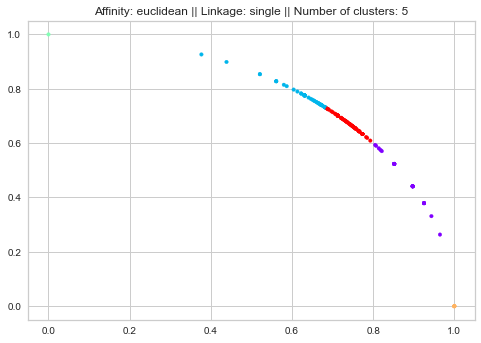

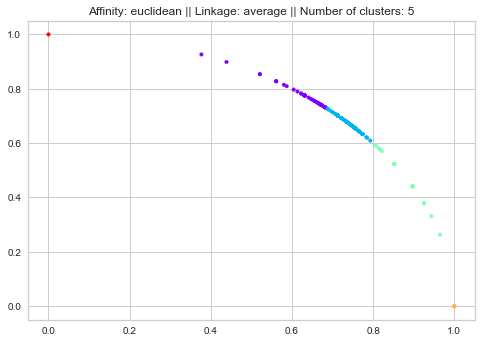

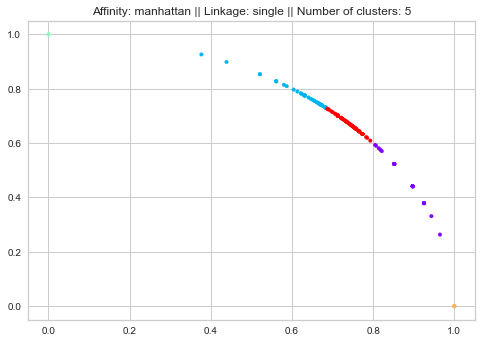

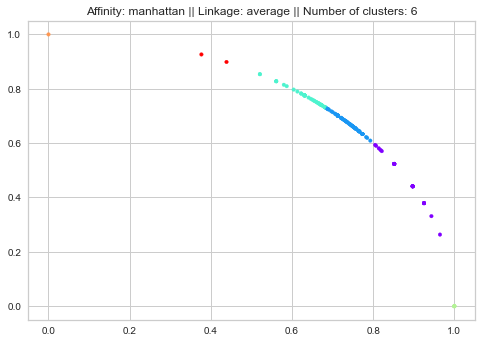

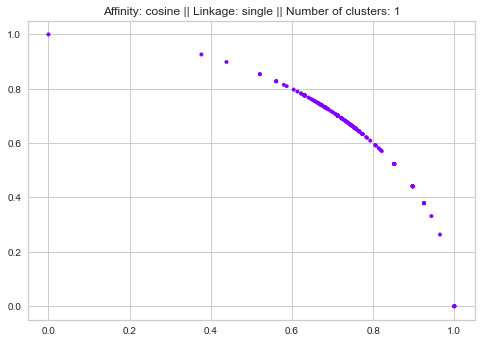

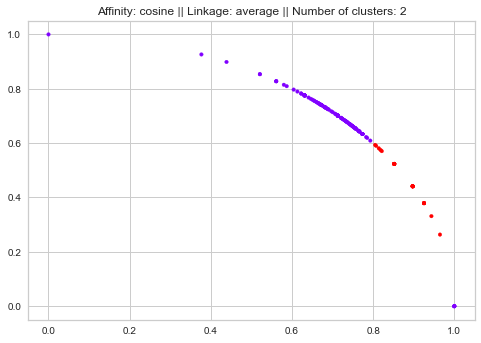

[5, 5, 5, 6, 2] [0.9138541776643541, 0.9138541776643541, 0.9138541776643541, 0.8742329060639429, 0.628710888241099]


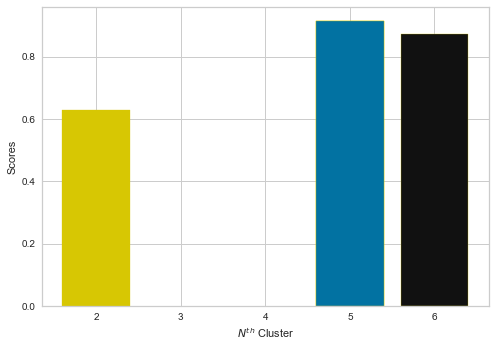

In [188]:
N_clusters = []
silhouette_scores = []

affinities = ['euclidean',  'manhattan', 'cosine']
linkages = ['single','average']
dist_thrsh = .3 # only var to be edited (How to choose distance thresh??)

for affin in affinities:
    for links in linkages:
        Custom_Aggl_Clust(df_pt_normed,affin,links,dist_thrsh)

Silhouette_Score_plt()

N_clusters.clear()
silhouette_scores.clear()

### Dendograph , silhouette scores and display the resulting clusters

For Sepal

0.0


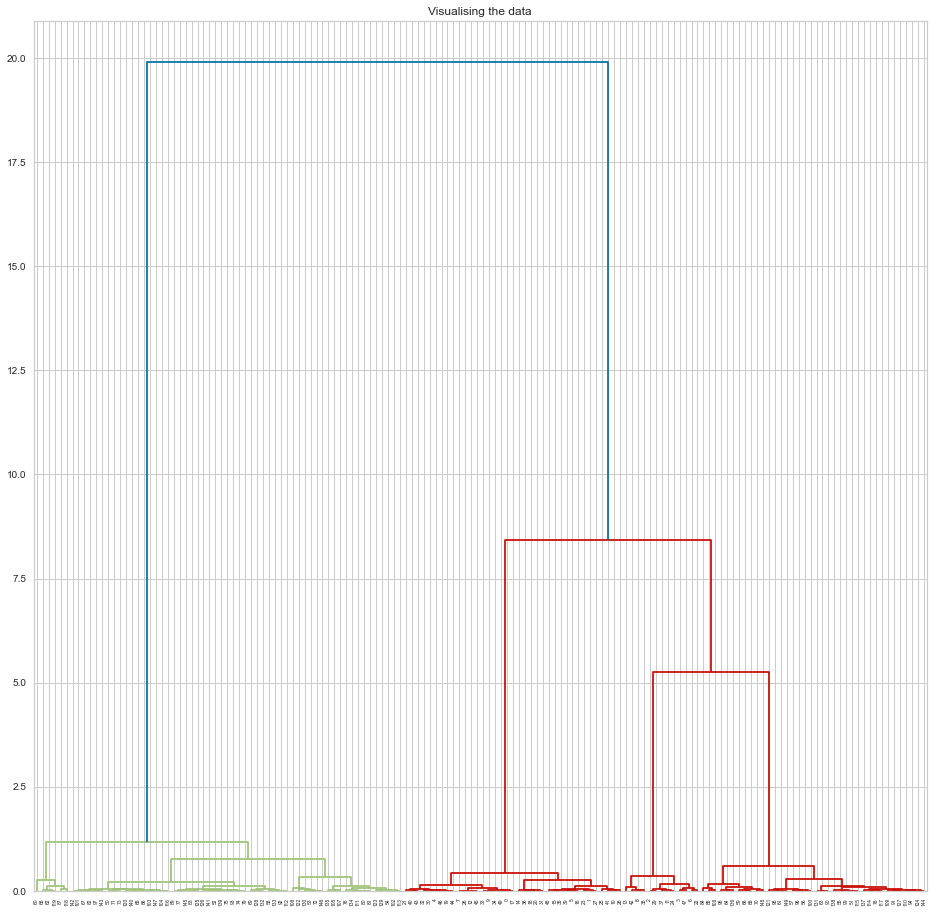

In [189]:
Dendograph_silh(df_sp_normed)

For Petal

0.0


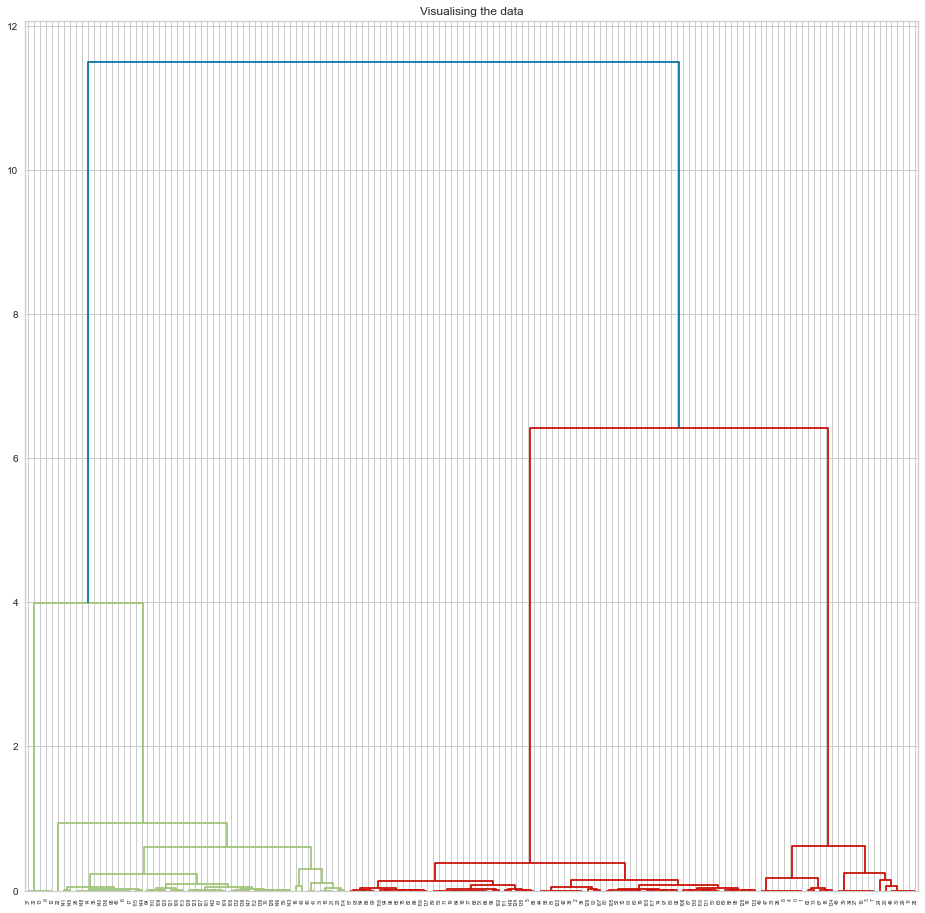

In [190]:
Dendograph_silh(df_pt_normed)

### DBScan 

For Sepal

0.09854060111123407


<Figure size 360x360 with 0 Axes>

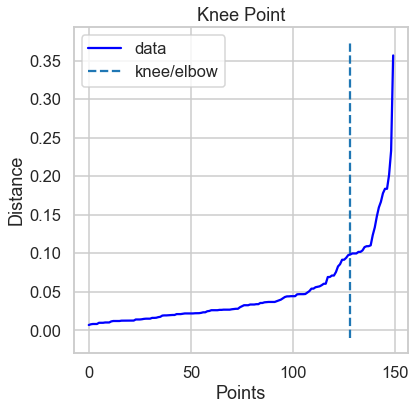

Elbow Point is 0.09854060111123407: 
Estimated number of clusters 3: 
Estimated number of noise points: 0
Estimated number of clustered points: 300
Total number of points: 300 
Effeciency: 100.000000%


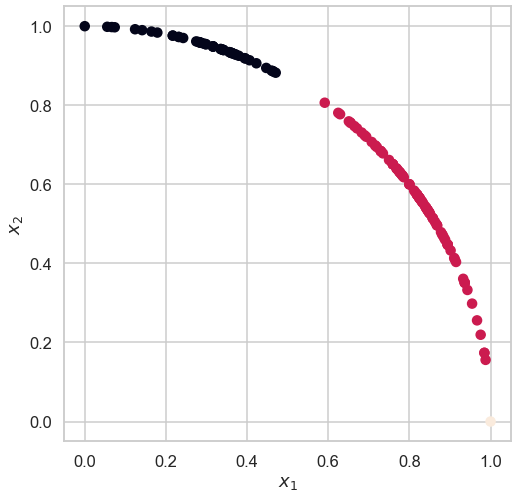

In [31]:
DB_Scan(arr_sp_normed,1)

For Petal

0.06878079993207212


<Figure size 360x360 with 0 Axes>

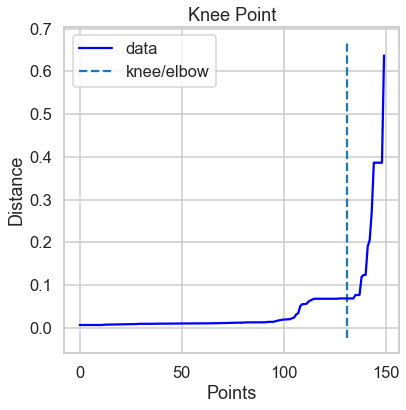

Elbow Point is 0.06878079993207212: 
Estimated number of clusters 6: 
Estimated number of noise points: 0
Estimated number of clustered points: 300
Total number of points: 300 
Effeciency: 100.000000%


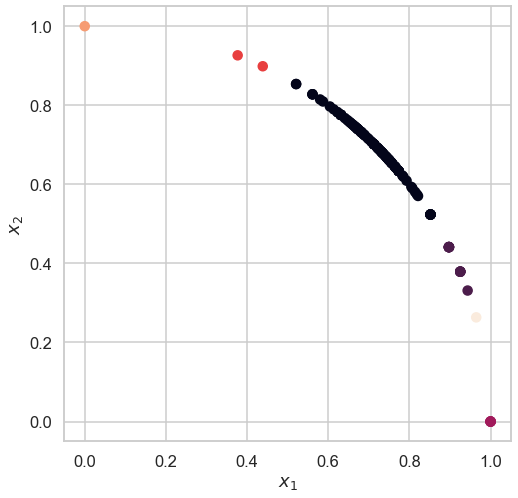

In [33]:
DB_Scan(arr_pt_normed,1)

### Gaussian Mixture

For Sepal

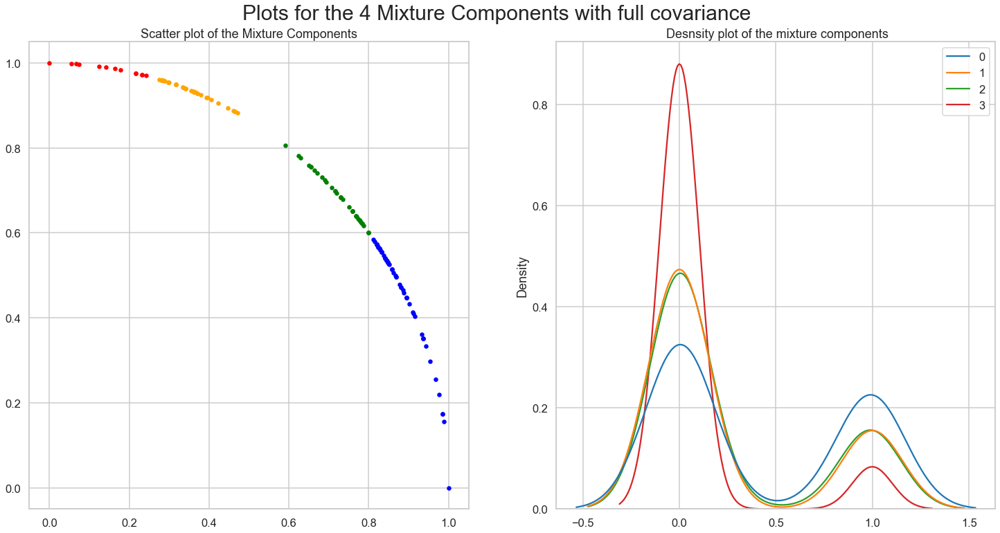

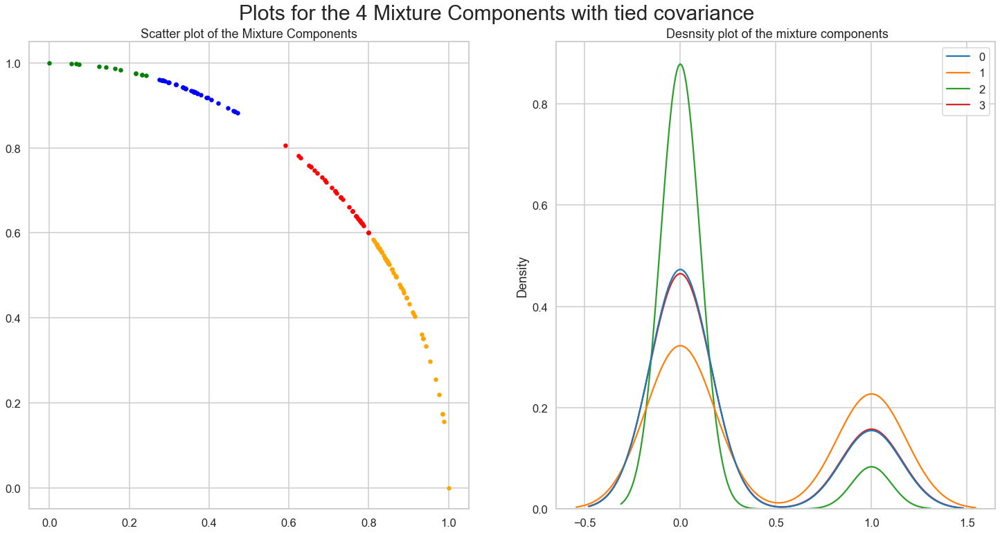

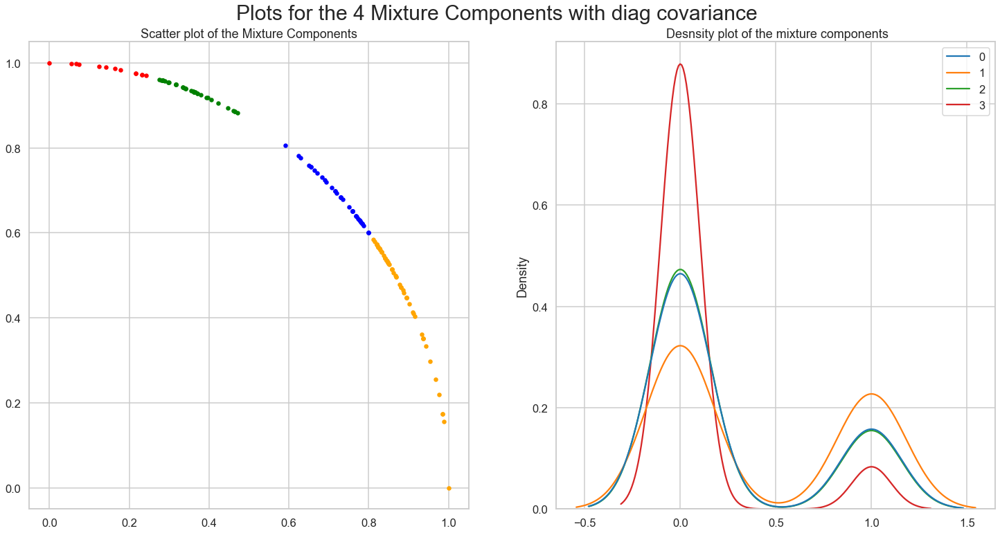

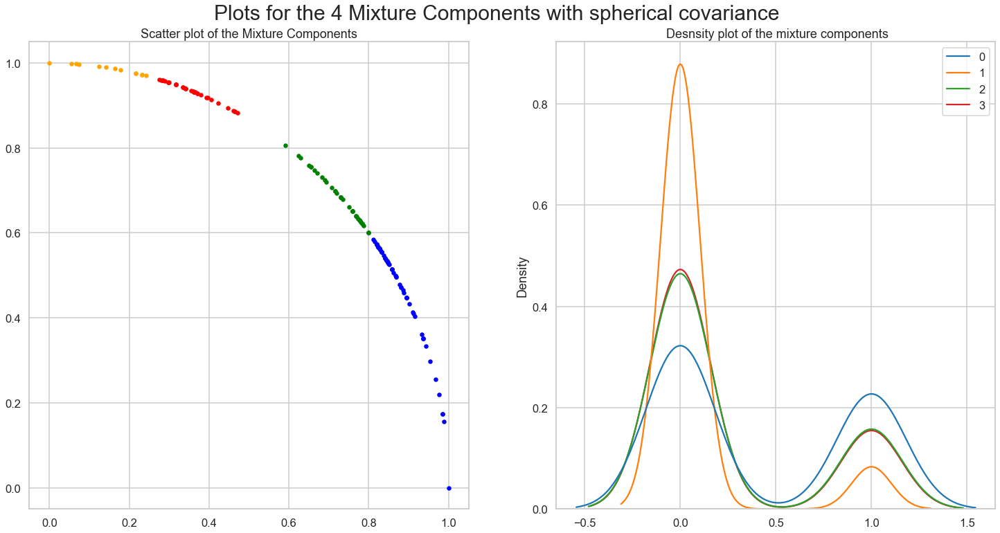

In [36]:
for covars in cov_types:
    Gaussian_cov(df_sp_normed,covars)

For Petal

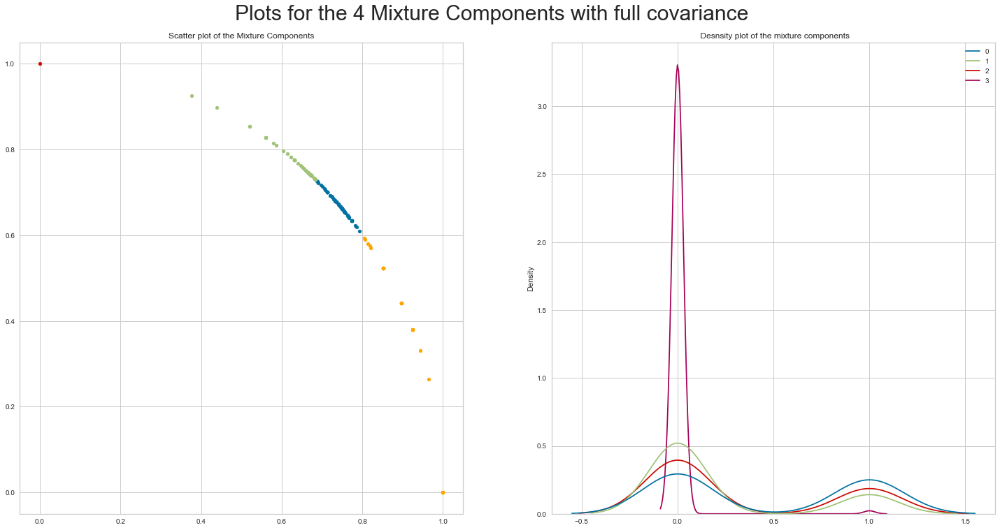

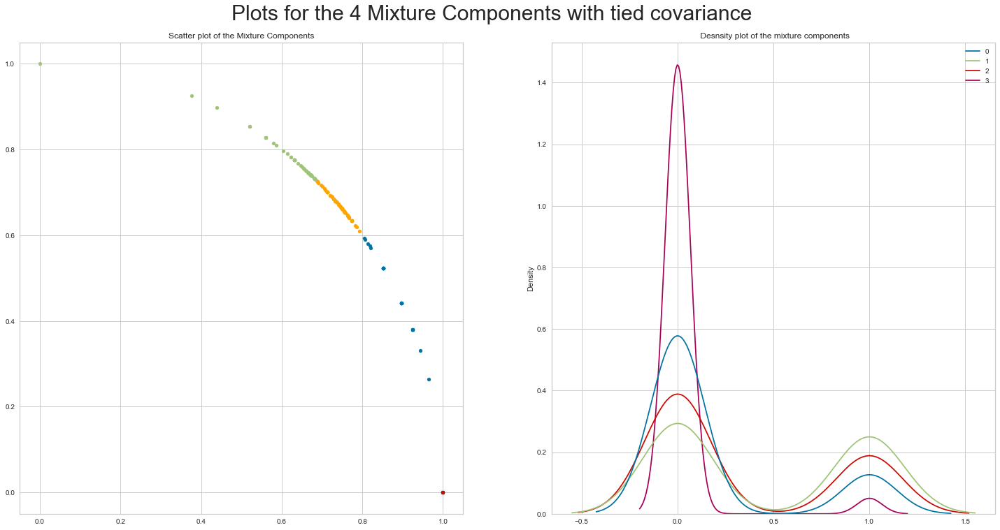

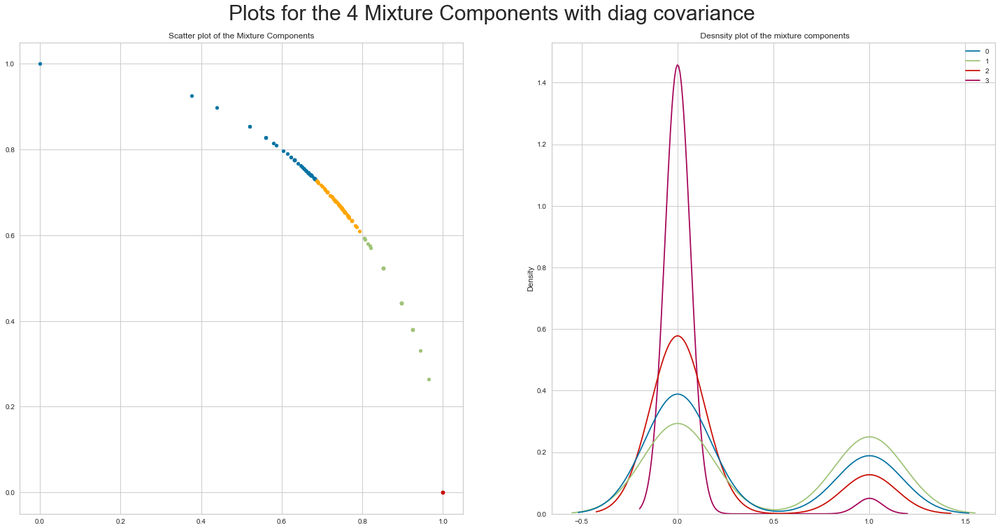

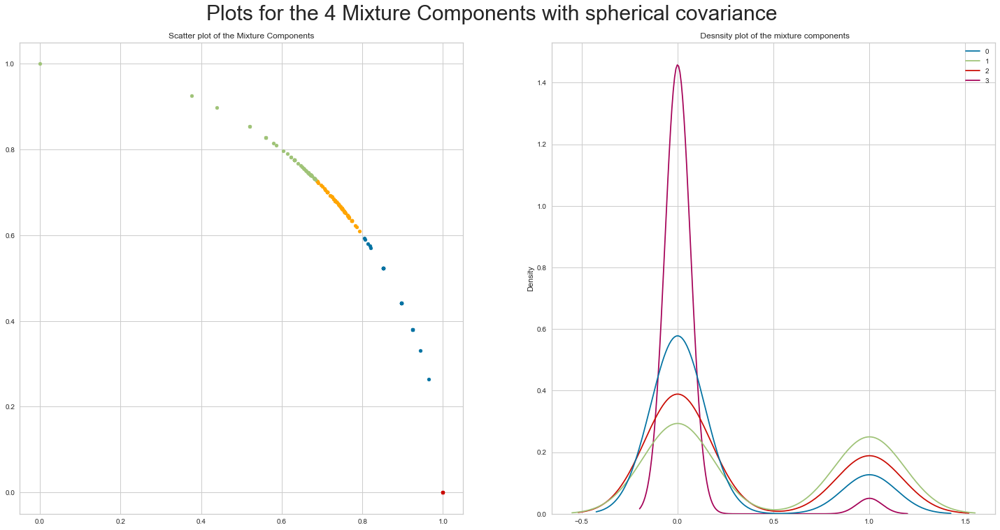

In [113]:
for covars in cov_types:
    Gaussian_cov(df_pt_normed,covars)

## Customer dataset
Repeat all the above on the customer data set 